In [33]:
import IPython
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pytorch_lightning as pl
import torch
from torch.utils.data import DataLoader
import SimpleITK as sitk 
import monai
from monai.data import list_data_collate
from monai.data import decollate_batch
from monai.networks.layers import Norm
from torch.optim.lr_scheduler import CosineAnnealingLR

from monai.visualize import img2tensorboard
from monai.utils import set_determinism
from monai.inferers import sliding_window_inference

monai.config.print_config()

# Import viz utils
# import sys
# sys.path.append(r'../../util')
# import visualization as viz
torch.cuda.empty_cache()

MONAI version: 0.9.0
Numpy version: 1.22.4
Pytorch version: 1.11.0
MONAI flags: HAS_EXT = False, USE_COMPILED = False
MONAI rev id: af0e0e9f757558d144b655c63afcea3a4e0a06f5
MONAI __file__: /home/lc2382/anaconda3/envs/monai-examples/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: 3.2.1
scikit-image version: 0.22.0
Pillow version: 9.0.1
Tensorboard version: 2.7.0
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: 0.12.0
tqdm version: 4.62.3
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: NOT INSTALLED or UNKNOWN VERSION.
pandas version: 2.2.1
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installa

In [2]:
print('CUDA available: ', torch.cuda.is_available())

n_gpus = torch.cuda.device_count()
for i in range(n_gpus):
    print('GPU %d: %s' % (i, torch.cuda.get_device_name(i)))


CUDA available:  True
GPU 0: Quadro RTX 8000


In [91]:
EXP_NAME = 'GradCAM_ResNet18_ISUPClassification_partialdata_binary_2d_nodp_nobn'
ROOT_PATH = r'.'
EXP_PATH = os.path.join(ROOT_PATH,EXP_NAME.lower())

# Create the study directory structure
if not os.path.exists(EXP_PATH):
    print('Creating experiment directory: {}'.format(EXP_PATH))
    os.mkdir(EXP_PATH)

print('Using experiment directory: {}'.format(EXP_PATH))


Using experiment directory: ./gradcam_resnet18_isupclassification_partialdata_binary_2d_nodp_nobn


### Filter those who had lesion

In [92]:
# from prostate_data.datasets import PICAI

# ROOT_PATH = r'/media/onofreyshare/Prostate/Processed/Public/PI-CAI'

# picai = PICAI(ROOT_PATH)
# picai.summarize()

# # df_picai = picai.get_dataset()

# df_picai = pd.read_csv("/data2/lc2382/prostate_cancer_data/notebooks/picai_max_unique.csv", index_col=0)
# df_picai['new_col'] = df_picai['new_col'].apply(lambda x: eval(x))

# df_picai = df_picai.dropna(subset="SEGM_LESION_HUMAN")

# df_picai = df_picai.rename(columns={'T2_AXIAL': 'IMAGE'})

# def filter_rows(df):
#     return df[df['new_col'].apply(lambda x: x[0] != 0)]

# df_picai_withlesion = filter_rows(df_picai)

# lst = ['DATASET_ID', 'PATIENT_ID', 'STUDY_ID', 'ADC', 'ADC_REGISTERED_BIS', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN', 'SEGM_LESION_AI', 'IMAGE']
# df_picai = df_picai[lst]
# df_picai_withlesion = df_picai_withlesion[lst]

# df_picai_withlesion

In [69]:
from prostate_data.datasets import PICAI

ROOT_PATH = r'/media/onofreyshare/Prostate/Processed/Public/PI-CAI'

picai = PICAI(ROOT_PATH)
picai.summarize()

df_picai = picai.get_dataset()

df_picai = df_picai.rename(columns={"T2_AXIAL": "IMAGE"})
df_picai.loc[df_picai['lesion_GS'].isna(), 'lesion_GS'] = 'N/A'
print(df_picai['lesion_GS'].unique())

df_picai['lesion_GS_split'] = df_picai['lesion_GS'].apply(lambda x: x.split(","))
df_picai['ISUP'] = np.nan

for i in range(df_picai.shape[0]):
    cur_GS_lst = df_picai.loc[i, 'lesion_GS_split']
    print(cur_GS_lst)
    ISUP_lst = []
    for j in cur_GS_lst:
        if j in ['0+0', 'N/A', '3+3', '3+2', '2+3', '2+4', '4+2']:
            cur_ISUP = 1
        elif j == '3+4':
            cur_ISUP = 2
        elif j == '4+3':
            cur_ISUP = 3
        elif j in ['3+5', '5+3', '4+4']:
            cur_ISUP = 4
        elif j in ['4+5', '5+4', '5+5']:
            cur_ISUP = 5
        else:
            cur_ISUP = 100
        ISUP_lst.append(cur_ISUP)
    
    max_ISUP = max(ISUP_lst)

    df_picai.loc[i, 'ISUP'] = max_ISUP

df_picai['ISUP'] = df_picai['ISUP'] - 1     # for classification, create group 0

# SUBSETTING
df_picai = df_picai[['DATASET_ID', 'PATIENT_ID', 'STUDY_ID', 'ADC_REGISTERED_BIS', 'SEGM_LESION_HUMAN', 'SEGM_WG_AI', 'IMAGE', 'ISUP']]
df_picai = df_picai[df_picai['SEGM_LESION_HUMAN'].notna()]

df_picai.ISUP.value_counts()

df_picai[df_picai['STUDY_ID'] == '1000167']

PI-CAI: 1476 unique patients
PI-CAI: 1500 unique studies
PI-CAI: 1500 total entries
['0+0' 'N/A' '0+0,0+0' '4+3,0+0' '0+0,3+3' '3+3' '4+3,3+4' '3+3,0+0' '3+4'
 'N/A,N/A,N/A,3+4' '4+3' '3+4,4+5,3+3' '3+3,0+0,0+0' '3+4,3+3'
 '3+4,N/A,N/A' '3+4,4+4' '2+3' '3+3,N/A' '4+4' '4+5,0+0' '3+3,3+4'
 '3+4,3+3,0+0' '0+0,4+3' '0+0,N/A' '4+5' '4+3,4+3' '3+4,N/A' '3+3,3+3'
 '3+3,3+3,3+3' 'N/A,0+0,0+0' '4+5,3+3' 'N/A,0+0,N/A' 'N/A,0+0'
 '0+0,N/A,N/A' '4+4,0+0,N/A' '3+2' '0+0,3+4' 'N/A,0+0,4+4' '4+3,3+3,3+4'
 '0+0,0+0,0+0' '4+5,N/A' '0+0,4+4' '4+3,3+3' '3+4,0+0' '5+4' '3+2,N/A'
 '3+4,3+4' '0+0,0+0,3+3' '3+5,0+0' '5+5' '3+4,3+3,3+4,3+4' '3+4,3+4,3+3'
 '3+3,0+0,3+3' '3+3,3+3,0+0' '4+5,4+3,4+3' '3+4,4+3,3+3' 'N/A,0+0,4+3'
 '3+4,3+4,0+0' '0+0,4+3,0+0' '4+4,0+0' '3+4,4+5' '4+3,N/A' '3+4,0+0,3+3'
 '5+4,0+0' '3+2,0+0' '4+5,0+0,0+0,N/A' 'N/A,3+3' '2+3,N/A,N/A' '4+4,3+2'
 'N/A,N/A,0+0' '3+5' '4+4,N/A' 'N/A,4+3' '0+0,N/A,3+3' '3+4,3+3,3+3'
 '5+4,4+3,4+5' '3+4,0+0,0+0' '4+5,4+3' '0+0,3+3,0+0' '3+3,0+0,N/A' '2+4'
 

['N/A']
['0+0']
['N/A']
['N/A']
['3+3', '3+3']
['N/A']
['0+0']
['3+3']
['N/A']
['3+4']
['3+3', '3+3']
['3+3']
['N/A']
['3+4', 'N/A']
['N/A']
['4+3', '3+3']
['0+0']
['0+0']
['0+0']
['3+3', '0+0']
['3+4']
['N/A']
['N/A']
['5+5', '5+3', '0+0']
['3+4']
['N/A']
['N/A']
['3+4', '0+0']
['0+0']
['3+4', '4+3']
['0+0']
['3+4', 'N/A']
['3+4']
['N/A']
['0+0']
['3+3', '3+3', '3+3']
['3+3', 'N/A']
['4+3']
['0+0']
['0+0', '0+0']
['4+3']
['3+4']
['3+4']
['N/A']
['3+4', '3+4']
['0+0']
['N/A']
['3+3']
['N/A']
['3+3']
['3+4']
['0+0']
['0+0']
['4+3']
['N/A']
['3+3']
['3+3', 'N/A']
['N/A']
['4+5']
['0+0']
['N/A']
['3+3']
['3+4']
['N/A']
['3+4', '0+0']
['0+0']
['0+0']
['4+3']
['3+4']
['3+2', '4+3', '3+3']
['0+0']
['3+3', 'N/A']
['0+0']
['N/A']
['N/A']
['N/A']
['3+3', 'N/A']
['N/A']
['0+0']
['N/A']
['4+5']
['N/A']
['N/A']
['3+3', '3+4', '3+5']
['3+4', '3+3', 'N/A']
['3+3']
['5+5', '5+5']
['N/A']
['3+3']
['3+4']
['3+4']
['N/A']
['N/A']
['0+0']
['N/A']
['N/A']
['0+0']
['4+5']
['N/A']
['N/A']
['0+0']
['N/A']
['

,DATASET_ID,PATIENT_ID,STUDY_ID,ADC_REGISTERED_BIS,SEGM_LESION_HUMAN,SEGM_WG_AI,IMAGE,ISUP
167,PI-CAI,10164,1000167,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,2.0


[0. 2. 1. 3. 4.]


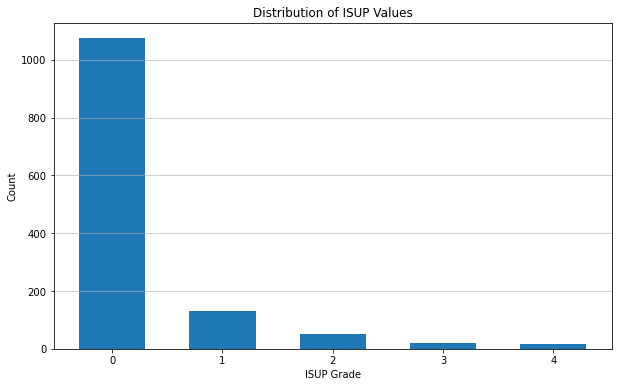

In [70]:
print(df_picai['ISUP'].unique())

plt.figure(figsize=(10, 6))

plt.hist(df_picai['ISUP'], bins=range(0, 6), align='left', rwidth=0.6)
plt.title('Distribution of ISUP Values')
plt.xlabel('ISUP Grade')
plt.ylabel('Count')
plt.xticks(range(0, 5))
plt.grid(axis='y', alpha=0.75)

### BALANCING CLASS

In [7]:
df_picai_balanced = df_picai[df_picai['ISUP'] == 0].sample(220, random_state=24)

df_picai_balanced = pd.concat([df_picai_balanced, df_picai[df_picai['ISUP'] == 1]], axis=0)
df_picai_balanced = pd.concat([df_picai_balanced, df_picai[df_picai['ISUP'] == 2]], axis=0)
df_picai_balanced = pd.concat([df_picai_balanced, df_picai[df_picai['ISUP'] == 3]], axis=0)
df_picai_balanced = pd.concat([df_picai_balanced, df_picai[df_picai['ISUP'] == 4]], axis=0)

df_picai_balanced = df_picai_balanced.sort_index()

df_picai_balanced

,DATASET_ID,PATIENT_ID,STUDY_ID,ADC_REGISTERED_BIS,SEGM_LESION_HUMAN,SEGM_WG_AI,IMAGE,ISUP
3,PI-CAI,10003,1000003,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0
5,PI-CAI,10005,1000005,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,2.0
6,PI-CAI,10006,1000006,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0
7,PI-CAI,10007,1000007,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0
12,PI-CAI,10012,1000012,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
...,...,...,...,...,...,...,...,...
1486,PI-CAI,11462,1001486,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,4.0
1489,PI-CAI,11465,1001489,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
1495,PI-CAI,11471,1001495,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
1498,PI-CAI,11474,1001498,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0


### DATA SPLIT

In [8]:
df_picai_balanced.loc[df_picai_balanced['ISUP'] != 0, 'ISUP'] = 1

print(df_picai_balanced['ISUP'].unique())

df_picai_balanced

[0. 1.]


,DATASET_ID,PATIENT_ID,STUDY_ID,ADC_REGISTERED_BIS,SEGM_LESION_HUMAN,SEGM_WG_AI,IMAGE,ISUP
3,PI-CAI,10003,1000003,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0
5,PI-CAI,10005,1000005,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
6,PI-CAI,10006,1000006,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0
7,PI-CAI,10007,1000007,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0
12,PI-CAI,10012,1000012,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
...,...,...,...,...,...,...,...,...
1486,PI-CAI,11462,1001486,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
1489,PI-CAI,11465,1001489,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
1495,PI-CAI,11471,1001495,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,1.0
1498,PI-CAI,11474,1001498,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,/media/onofreyshare/Prostate/Processed/Public/...,0.0


In [9]:
df_picai_balanced['ISUP'].value_counts()

ISUP
0.0    220
1.0    220
Name: count, dtype: int64

In [10]:
from sklearn.model_selection import ShuffleSplit

print(df_picai_balanced.columns)
# Set the test and validation set size percentage
test_size_percent = 0.2
validation_size_percent = 0.2

# # Only use the first image instance
# df_valid = df[df['VISIT_ID']==1].copy()
# print('Dataset contains total %d entries' % len(df_valid))

n = len(df_picai_balanced)
# n = 200
X = np.arange(n)
print(n)
# G = df_valid['SITE_ID']
# print(G.value_counts(normalize=True))

rs_test = ShuffleSplit(n_splits=1, random_state=42, test_size=test_size_percent, train_size=None)       # split test & `THE OTHERS`
rs_val = ShuffleSplit(n_splits=1, random_state=42, test_size=validation_size_percent/(1-test_size_percent), train_size=None)

temp_idx, test_idx = next(rs_test.split(X=X))
print("tempidx:", len(temp_idx), temp_idx[:10], max(temp_idx))
print("testidx:", len(test_idx), test_idx[:10], max(test_idx))

train_idx, val_idx = next(rs_val.split(X=temp_idx))
print("train_idx:", len(train_idx), train_idx[:10], max(train_idx))
print("val_idx:", len(val_idx), val_idx[:10], max(val_idx))

# train_idx & val_idx is the relative index from rs_val 
# (need to convert from relative indices to absolute indices)
test_idx = test_idx
val_idx = temp_idx[val_idx]
train_idx = temp_idx[train_idx]

print()
# print('X', X)       # np.arange(n)
print('temp_idx', len(temp_idx), np.sort(temp_idx)[:20])
print('test_idx', len(test_idx), np.sort(test_idx)[:20])
print('train_idx',len(train_idx), np.sort(train_idx)[:20])
print('val_idx', len(val_idx), np.sort(val_idx)[:20])

print('Train/Val/Test split size: {}/{}/{}'.format(
    len(train_idx), len(val_idx), len(test_idx)
))

df_train = df_picai_balanced.iloc[train_idx].copy()
# print(df_train['SITE_ID'].value_counts(normalize=True))
df_val = df_picai_balanced.iloc[val_idx].copy()
# print(df_val['SITE_ID'].value_counts(normalize=True))
df_test = df_picai_balanced.iloc[test_idx].copy()
# print(df_test['SITE_ID'].value_counts(normalize=True))

# sorted(train_idx)
df_train.sort_index()['ISUP']

df_val['IMAGE'].values

Index(['DATASET_ID', 'PATIENT_ID', 'STUDY_ID', 'ADC_REGISTERED_BIS',
       'SEGM_LESION_HUMAN', 'SEGM_WG_AI', 'IMAGE', 'ISUP'],
      dtype='object')
440
tempidx: 352 [266 294  31  84 301 400  94 408 431 153] 439
testidx: 88 [265  78 347 255 327 291 184  82 438 405] 438
train_idx: 264 [249 326 211 261  17 239  24 309 290 180] 351
val_idx: 88 [228 116  55 155 110 126  39  63 240  75] 350

temp_idx 352 [ 1  2  3  4  5  6  7  8 10 11 12 13 14 16 18 20 21 23 26 27]
test_idx 88 [ 0  9 15 17 19 22 24 25 30 33 39 42 46 55 56 57 66 70 72 73]
train_idx 264 [ 1  3  4  5  7  8 10 11 12 14 16 18 20 21 23 26 27 31 36 37]
val_idx 88 [  2   6  13  28  29  32  34  35  51  58  68  69  84  87  89  95 100 110
 114 115]
Train/Val/Test split size: 264/88/88


array(['/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10625_1000639_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10257_1000261_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10790_1000806_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/11142_1001165_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10815_1000831_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10256_1000260_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/11385_1001409_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10634_1000650_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10814_1000830_t2w.nii.gz',
       '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/11103_1001126_t2w.nii.gz',
       '/media/onofr

In [11]:
# Convert DF to dictionary
train_data_dict = df_train.to_dict('records')
val_data_dict = df_val.to_dict('records')
test_data_dict = df_test.to_dict('records')

print('Number of training files: ', len(train_data_dict))
print('Number of validation files: ', len(val_data_dict))
print('Number of testing files: ', len(test_data_dict))

train_data_dict[1:2]

Number of training files:  264
Number of validation files:  88
Number of testing files:  88


[{'DATASET_ID': 'PI-CAI',
  'PATIENT_ID': '10691',
  'STUDY_ID': '1000707',
  'ADC_REGISTERED_BIS': '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/registered/adc_bis/10691_1000707_t2w_10691_1000707_adc_10691_1000707_t2w_10691_1000707_adc_rigid.nii.gz',
  'SEGM_LESION_HUMAN': '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/annotation/csPCa_lesion_delineations/human_expert/resampled/10691_1000707.nii.gz',
  'SEGM_WG_AI': '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/annotation/anatomical_delineations/whole_gland/AI/Bosma22b/10691_1000707.nii.gz',
  'IMAGE': '/media/onofreyshare/Prostate/Processed/Public/PI-CAI/nifti/t2w/10691_1000707_t2w.nii.gz',
  'ISUP': 0.0}]

In [12]:
SPACING = (0.5, 0.5, 3)
# PATCH_SIZE  = (192,192,8)
PATCH_SIZE  = (128,128,16)

train_transforms = monai.transforms.Compose([
    monai.transforms.LoadImaged(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], reader='NibabelReader', as_closest_canonical=True),
    monai.transforms.EnsureChannelFirstd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN']),
    monai.transforms.Orientationd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], axcodes='RAS'),
    
    # is there really a need for this? Cuz we need high resolution
    monai.transforms.Spacingd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'],
        pixdim=SPACING, mode=('bilinear', 'bilinear', 'nearest', 'nearest'), 
        padding_mode=('reflection', 'reflection', 'reflection', 'reflection')
    ),
    
    monai.transforms.CropForegroundD(
        keys=['ADC_REGISTERED_BIS','IMAGE','SEGM_WG_AI','SEGM_LESION_HUMAN'],
        source_key='SEGM_WG_AI',
        select_fn=lambda x: x>0,
        margin=[64, 64, 8]
    ),

    # Ensure minimum patch ROI size is present
    monai.transforms.SpatialPadd(
        keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], 
        spatial_size=PATCH_SIZE, mode=('reflect', 'reflect', 'reflect', 'reflect')
    ),
    # monai.transforms.RandCropByLabelClassesd(
    #     keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], 
    #     label_key="SEGM_LESION_HUMAN",
    #     spatial_size=PATCH_SIZE,
    #     num_classes=2,
    # ),
    monai.transforms.CenterSpatialCropd(
        keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], 
        roi_size=PATCH_SIZE
    ),
    # monai.transforms.RandCropByPosNegLabeld(
    #     keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], 
    #     label_key='SEGM_LESION_HUMAN', 
    #     spatial_size=PATCH_SIZE, pos=4.0
    # ),
    
    monai.transforms.ScaleIntensityRangePercentilesd(
        keys=['ADC_REGISTERED_BIS', 'IMAGE'], 
        lower=10, upper=90, b_min=-0.5, b_max=0.5, clip=False
    ),

#     monai.transforms.RandFlipd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], prob=0.5, spatial_axis=0),
    ## concat
    # monai.transforms.ConcatItemsD(keys=['ADC', 'IMAGE'], name='ADC_T2', dim=0),
    monai.transforms.ToTensord(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'])
])

test_transforms = monai.transforms.Compose([
    monai.transforms.LoadImaged(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], reader='NibabelReader', as_closest_canonical=True),
    monai.transforms.EnsureChannelFirstd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN']),
    monai.transforms.Orientationd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'], axcodes='RAS'),

    monai.transforms.Spacingd(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'],
        pixdim=SPACING, mode=('bilinear', 'bilinear', 'nearest', 'nearest'), 
        padding_mode=('reflection', 'reflection', 'reflection', 'reflection')
    ),
    
    monai.transforms.ScaleIntensityRangePercentilesd(keys=['ADC_REGISTERED_BIS', 'IMAGE'], lower=25, upper=75, b_min=-0.5, b_max=0.5, clip=False),
    # concat
    # monai.transforms.ConcatItemsD(keys=['ADC', 'IMAGE'], name='ADC_T2', dim=0),
    # monai.transforms.ToTensord(keys=['ADC_T2', 'SEGM_LESION_HUMAN'])
    monai.transforms.ToTensord(keys=['ADC_REGISTERED_BIS', 'IMAGE', 'SEGM_WG_AI', 'SEGM_LESION_HUMAN'])
])

# val_transforms = test_transforms
val_transforms = train_transforms


test_transforms1 = train_transforms

In [13]:
def calculate_volume(segm, spacing):
    """Calculate segmentation volume in cubic centimeters.
    
    Inputs:
        segm (numpy array): the binary segmentation image (N-D image).
        spacing (sequence of N floats): the image voxel spacing in mm (assumes N-D image).
    """

    # Convert mm to cm (prostate volumes typically reportes as cm^3 (= cc = ml^3)
    cm2mm = 0.1
    scalar = pow(cm2mm,len(spacing))
    
    # Sum the segmented voxels
    segm_sum = segm.sum()
    # Multiply by the voxel spacing and the unit conversion factor
    vol = segm_sum*np.prod(SPACING)*scalar

    return vol

['10625']
['1000639']
dict_keys(['DATASET_ID', 'PATIENT_ID', 'STUDY_ID', 'ADC_REGISTERED_BIS', 'SEGM_LESION_HUMAN', 'SEGM_WG_AI', 'IMAGE', 'ISUP', 'ADC_REGISTERED_BIS_meta_dict', 'IMAGE_meta_dict', 'SEGM_WG_AI_meta_dict', 'SEGM_LESION_HUMAN_meta_dict', 'ADC_REGISTERED_BIS_transforms', 'IMAGE_transforms', 'SEGM_WG_AI_transforms', 'SEGM_LESION_HUMAN_transforms', 'foreground_start_coord', 'foreground_end_coord'])
dict_keys(['sizeof_hdr', 'extents', 'session_error', 'dim_info', 'dim', 'intent_p1', 'intent_p2', 'intent_p3', 'intent_code', 'datatype', 'bitpix', 'slice_start', 'pixdim', 'vox_offset', 'scl_slope', 'scl_inter', 'slice_end', 'slice_code', 'xyzt_units', 'cal_max', 'cal_min', 'slice_duration', 'toffset', 'glmax', 'glmin', 'qform_code', 'sform_code', 'quatern_b', 'quatern_c', 'quatern_d', 'qoffset_x', 'qoffset_y', 'qoffset_z', 'srow_x', 'srow_y', 'srow_z', 'affine', 'original_affine', 'as_closest_canonical', 'spatial_shape', 'original_channel_dim', 'filename_or_obj'])
image shape t

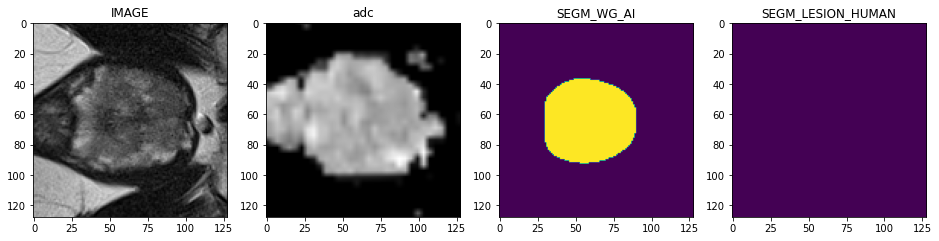

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])



KeyboardInterrupt: 

In [14]:
# check_ds = monai.data.Dataset(data=train_data_dict[13:14], transform=train_transforms)
check_ds = monai.data.Dataset(data=val_data_dict[:5], transform=val_transforms)
# check_ds = monai.data.Dataset(data=test_data_dict[:1], transform=test_transforms)
# check_ds = monai.data.Dataset(data=test_data_dict[:1], transform=test_transforms1)
check_loader = DataLoader(check_ds, batch_size=1, num_workers=0, collate_fn=list_data_collate)
check_data = monai.utils.misc.first(check_loader) 
print(check_data['PATIENT_ID'])
print(check_data['STUDY_ID'])
print(check_data.keys())
print(check_data['IMAGE_meta_dict'].keys())

print('image shape {} , adc shape: {}, wg_seg shape: {}, raw label shape: {}' \
      .format(check_data['IMAGE'].shape, check_data['ADC_REGISTERED_BIS'].shape, check_data['SEGM_WG_AI'].shape, check_data['SEGM_LESION_HUMAN'].shape))

image = check_data['IMAGE'][0][0]
label = check_data['SEGM_LESION_HUMAN'][0][0]
segm_wg = check_data['SEGM_WG_AI'][0][0]
adc = check_data['ADC_REGISTERED_BIS'][0][0]
y = check_data['ISUP']

print("y", y)
print("label max", torch.max(label))
print("label max clamp", torch.max(torch.clamp(label, max=1.0)))
# print("ADC mean: {}".format(np.mean(adc.numpy())))
# print('image mean: {}'.format(np.mean(image.numpy())))
print('img mean: {}'.format(np.mean(image.numpy())))
print('prostate volume: {:.2f} cc'.format(calculate_volume(label, SPACING)))

for idx, check_data in enumerate(check_loader):
    image = check_data['IMAGE'][0][0]
    label = check_data['SEGM_LESION_HUMAN'][0][0]
    segm_wg = check_data['SEGM_WG_AI'][0][0]
    adc = check_data['ADC_REGISTERED_BIS'][0][0]
    y = check_data['ISUP']
    print(check_data['PATIENT_ID'])
    print(check_data['STUDY_ID'])
    print("ISUP:", y)
    slice_num = 6
    plt.figure('check', (16, 8))
    plt.subplot(1, 4, 1)
    plt.title('IMAGE')
    plt.imshow(image[:,:,slice_num], cmap='gray')
    plt.subplot(1, 4, 2)
    plt.title('adc')
    plt.imshow(adc[:,:,slice_num], cmap='gray')
    plt.subplot(1, 4, 3)
    plt.title('SEGM_WG_AI')
    plt.imshow(segm_wg[:,:,slice_num])
    plt.subplot(1, 4, 4)
    plt.title('SEGM_LESION_HUMAN')
    plt.imshow(label[:,:,slice_num])
    plt.show()


    print(label.sum(dim=(0,1)))
    print()


In [15]:
# sanity_check = df_picai[df_picai['STUDY_ID'] == '1000110']

# sanity_T2W = sanity_check["IMAGE"]
# sanity_ADC = sanity_check["ADC_REGISTERED_BIS"]

# t2w = sitk.GetArrayFromImage(sitk.ReadImage(sanity_T2W))
# t2w.shape

# plt.imshow(image[:,:], cmap='gray')

In [16]:
train_ds = monai.data.CacheDataset(
    data=train_data_dict,
    transform=train_transforms, 
)
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, collate_fn=list_data_collate)


Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 264/264 [13:24<00:00,  3.05s/it]


In [17]:
# Use CacheDataset for validation
# import monai
val_ds = monai.data.CacheDataset(
    data=val_data_dict, transform=val_transforms
)

val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=8)     # why batch_size=1, very vague memory that it should be 1, kind of forget why..

Loading dataset:  24%|███████████████████████████████                                                                                                   | 21/88 [00:48<01:18,  1.17s/it]/home/lc2382/anaconda3/envs/monai-examples/lib/python3.9/site-packages/monai/transforms/intensity/array.py:769: Warning: Divide by zero (a_min == a_max)
  warn("Divide by zero (a_min == a_max)", Warning)
Loading dataset: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 88/88 [04:24<00:00,  3.00s/it]


In [18]:
# Use CacheDataset for testing
test_ds = monai.data.CacheDataset(
    data=test_data_dict, transform=test_transforms1
)

test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=8)

Loading dataset: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 88/88 [04:56<00:00,  3.37s/it]


In [106]:
train_loader

In [107]:
val_loader

In [109]:
test_loader

### GRAD CAM

In [111]:
# Copyright (c) MONAI Consortium
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#     http://www.apache.org/licenses/LICENSE-2.0
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

from functools import partial
from typing import Any, Callable, List, Optional, Tuple, Type, Union

import torch
import torch.nn as nn

from monai.networks.layers.factories import Conv, Norm, Pool
from monai.networks.layers.utils import get_pool_layer
from monai.utils import ensure_tuple_rep
from monai.utils.module import look_up_option

__all__ = ["ResNet", "resnet10", "resnet18", "resnet34", "resnet50", "resnet101", "resnet152", "resnet200"]

from monai.utils import deprecated_arg


def get_inplanes():
    return [64, 128, 256, 512]


def get_avgpool():
    return [0, 1, (1, 1), (1, 1, 1)]


class ResNetBlock(nn.Module):
    expansion = 1

    def __init__(
        self,
        in_planes: int,
        planes: int,
        spatial_dims: int = 3,
        stride: int = 1,
        downsample: Union[nn.Module, partial, None] = None,
    ) -> None:
        """
        Args:
            in_planes: number of input channels.
            planes: number of output channels.
            spatial_dims: number of spatial dimensions of the input image.
            stride: stride to use for first conv layer.
            downsample: which downsample layer to use.
        """
        super().__init__()

        conv_type: Callable = Conv[Conv.CONV, spatial_dims]
        norm_type: Callable = Norm[Norm.BATCH, spatial_dims]

        self.conv1 = conv_type(in_planes, planes, kernel_size=3, padding=1, stride=stride, bias=False)
#         self.bn1 = norm_type(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv_type(planes, planes, kernel_size=3, padding=1, bias=False)
#         self.bn2 = norm_type(planes)
#         self.dropout = nn.Dropout(p=0.1)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residual = x

        out: torch.Tensor = self.conv1(x)
#         out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
#         out = self.bn2(out)
#         out = self.dropout(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class ResNetBottleneck(nn.Module):
    expansion = 4

    def __init__(
        self,
        in_planes: int,
        planes: int,
        spatial_dims: int = 3,
        stride: int = 1,
        downsample: Union[nn.Module, partial, None] = None,
    ) -> None:
        """
        Args:
            in_planes: number of input channels.
            planes: number of output channels (taking expansion into account).
            spatial_dims: number of spatial dimensions of the input image.
            stride: stride to use for second conv layer.
            downsample: which downsample layer to use.
        """

        super().__init__()

        conv_type: Callable = Conv[Conv.CONV, spatial_dims]
        norm_type: Callable = Norm[Norm.BATCH, spatial_dims]

        self.conv1 = conv_type(in_planes, planes, kernel_size=1, bias=False)
#         self.bn1 = norm_type(planes)
        self.conv2 = conv_type(planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
#         self.bn2 = norm_type(planes)
        self.conv3 = conv_type(planes, planes * self.expansion, kernel_size=1, bias=False)
#         self.bn3 = norm_type(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residual = x

        out: torch.Tensor = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class ResNetWithGradCAM(nn.Module):
    """
    ResNet based on: `Deep Residual Learning for Image Recognition <https://arxiv.org/pdf/1512.03385.pdf>`_
    and `Can Spatiotemporal 3D CNNs Retrace the History of 2D CNNs and ImageNet? <https://arxiv.org/pdf/1711.09577.pdf>`_.
    Adapted from `<https://github.com/kenshohara/3D-ResNets-PyTorch/tree/master/models>`_.

    Args:
        block: which ResNet block to use, either Basic or Bottleneck.
        layers: how many layers to use.
        block_inplanes: determine the size of planes at each step. Also tunable with widen_factor.
        spatial_dims: number of spatial dimensions of the input image.
        n_input_channels: number of input channels for first convolutional layer.
        conv1_t_size: size of first convolution layer, determines kernel and padding.
        conv1_t_stride: stride of first convolution layer.
        no_max_pool: bool argument to determine if to use maxpool layer.
        shortcut_type: which downsample block to use. Options are 'A', 'B', default to 'B'.
            - 'A': using `self._downsample_basic_block`.
            - 'B': kernel_size 1 conv + norm.
        widen_factor: widen output for each layer.
        num_classes: number of output (classifications).
        feed_forward: whether to add the FC layer for the output, default to `True`.

    .. deprecated:: 0.6.0
        ``n_classes`` is deprecated, use ``num_classes`` instead.

    """

    @deprecated_arg("n_classes", since="0.6")
    def __init__(
        self,
        block: Type[Union[ResNetBlock, ResNetBottleneck]],
        layers: List[int],
        block_inplanes: List[int],
        spatial_dims: int = 3,
        n_input_channels: int = 3,
        conv1_t_size: Union[Tuple[int], int] = 7,
        conv1_t_stride: Union[Tuple[int], int] = 1,
        no_max_pool: bool = False,
        shortcut_type: str = "B",
        widen_factor: float = 1.0,
        num_classes: int = 400,
        feed_forward: bool = True,
        n_classes: Optional[int] = None,
    ) -> None:

        super().__init__()
        # in case the new num_classes is default but you still call deprecated n_classes

        # self.features = None
        self.gradient = None

        if n_classes is not None and num_classes == 400:
            num_classes = n_classes

        conv_type: Type[Union[nn.Conv1d, nn.Conv2d, nn.Conv3d]] = Conv[Conv.CONV, spatial_dims]
        norm_type: Type[Union[nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d]] = Norm[Norm.BATCH, spatial_dims]
        pool_type: Type[Union[nn.MaxPool1d, nn.MaxPool2d, nn.MaxPool3d]] = Pool[Pool.MAX, spatial_dims]
        avgp_type: Type[Union[nn.AdaptiveAvgPool1d, nn.AdaptiveAvgPool2d, nn.AdaptiveAvgPool3d]] = Pool[
            Pool.ADAPTIVEAVG, spatial_dims
        ]

        block_avgpool = get_avgpool()
        block_inplanes = [int(x * widen_factor) for x in block_inplanes]

        self.in_planes = block_inplanes[0]
        self.no_max_pool = no_max_pool

        conv1_kernel_size = ensure_tuple_rep(conv1_t_size, spatial_dims)
        conv1_stride = ensure_tuple_rep(conv1_t_stride, spatial_dims)

        self.conv1 = conv_type(
            n_input_channels,
            self.in_planes,
            kernel_size=conv1_kernel_size,  # type: ignore
            stride=conv1_stride,  # type: ignore
            padding=tuple(k // 2 for k in conv1_kernel_size),  # type: ignore
            bias=False,
        )
#         self.bn1 = norm_type(self.in_planes)
#         self.dropout = nn.Dropout(p=0.1)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = pool_type(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, block_inplanes[0], layers[0], spatial_dims, shortcut_type)
        self.layer2 = self._make_layer(block, block_inplanes[1], layers[1], spatial_dims, shortcut_type, stride=2)
        self.layer3 = self._make_layer(block, block_inplanes[2], layers[2], spatial_dims, shortcut_type, stride=2)
        self.layer4 = self._make_layer(block, block_inplanes[3], layers[3], spatial_dims, shortcut_type, stride=2)

        self.features = nn.Sequential(
            self.conv1,
#             self.bn1,
#             self.dropout,
            self.relu,
            self.maxpool,
            self.layer1,
            self.layer2,
            self.layer3,
            self.layer4,
        )

        self.avgpool = avgp_type(block_avgpool[spatial_dims])
        self.fc = nn.Linear(block_inplanes[3] * block.expansion, num_classes) if feed_forward else None

        for m in self.modules():
            if isinstance(m, conv_type):
                nn.init.kaiming_normal_(torch.as_tensor(m.weight), mode="fan_out", nonlinearity="relu")
            elif isinstance(m, norm_type):
                nn.init.constant_(torch.as_tensor(m.weight), 1)
                nn.init.constant_(torch.as_tensor(m.bias), 0)
            elif isinstance(m, nn.Linear):
                nn.init.constant_(torch.as_tensor(m.bias), 0)


    def _downsample_basic_block(self, x: torch.Tensor, planes: int, stride: int, spatial_dims: int = 3) -> torch.Tensor:
        out: torch.Tensor = get_pool_layer(("avg", {"kernel_size": 1, "stride": stride}), spatial_dims=spatial_dims)(x)
        zero_pads = torch.zeros(out.size(0), planes - out.size(1), *out.shape[2:], dtype=out.dtype, device=out.device)
        out = torch.cat([out.data, zero_pads], dim=1)
        return out

    def _make_layer(
        self,
        block: Type[Union[ResNetBlock, ResNetBottleneck]],
        planes: int,
        blocks: int,
        spatial_dims: int,
        shortcut_type: str,
        stride: int = 1,
    ) -> nn.Sequential:

        conv_type: Callable = Conv[Conv.CONV, spatial_dims]
        norm_type: Callable = Norm[Norm.BATCH, spatial_dims]

        downsample: Union[nn.Module, partial, None] = None
        if stride != 1 or self.in_planes != planes * block.expansion:
            if look_up_option(shortcut_type, {"A", "B"}) == "A":
                downsample = partial(
                    self._downsample_basic_block,
                    planes=planes * block.expansion,
                    stride=stride,
                    spatial_dims=spatial_dims,
                )
            else:
                downsample = nn.Sequential(
                    conv_type(self.in_planes, planes * block.expansion, kernel_size=1, stride=stride),
#                     norm_type(planes * block.expansion),
                )

        layers = [
            block(
                in_planes=self.in_planes, planes=planes, spatial_dims=spatial_dims, stride=stride, downsample=downsample
            )
        ]

        self.in_planes = planes * block.expansion
        for _i in range(1, blocks):
            layers.append(block(self.in_planes, planes, spatial_dims=spatial_dims))

        return nn.Sequential(*layers)

    def forward(self, x: torch.Tensor) -> torch.Tensor:

        x = self.features(x)
        x.requires_grad_(True)
        # print(x.requires_grad)
        h = x.register_hook(self.activations_hook)
    
        x = self.avgpool(x)

        x = x.view(x.size(0), -1)

        if self.fc is not None:
            x = self.fc(x)

        return x

    def activations_hook(self, grad):
        self.gradient = grad

    def get_activations_gradients(self):
        return self.gradient

    def get_activations(self, x):
        return self.features(x)


# def _resnet(
#     arch: str,
#     block: Type[Union[ResNetBlock, ResNetBottleneck]],
#     layers: List[int],
#     block_inplanes: List[int],
#     pretrained: bool,
#     progress: bool,
#     **kwargs: Any,
# ) -> ResNetWithGradCAM:
#     model: ResNet = ResNet(block, layers, block_inplanes, **kwargs)
#     if pretrained:
#         # Author of paper zipped the state_dict on googledrive,
#         # so would need to download, unzip and read (2.8gb file for a ~150mb state dict).
#         # Would like to load dict from url but need somewhere to save the state dicts.
#         raise NotImplementedError(
#             "Currently not implemented. You need to manually download weights provided by the paper's author"
#             " and load then to the model with `state_dict`. See https://github.com/Tencent/MedicalNet"
#         )
#     return model


# def resnet10(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-10 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 23 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet10", ResNetBlock, [1, 1, 1, 1], get_inplanes(), pretrained, progress, **kwargs)


# def resnet18(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-18 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 23 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet18", ResNetBlock, [2, 2, 2, 2], get_inplanes(), pretrained, progress, **kwargs)


# def resnet34(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-34 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 23 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet34", ResNetBlock, [3, 4, 6, 3], get_inplanes(), pretrained, progress, **kwargs)


# def resnet50(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-50 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 23 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet50", ResNetBottleneck, [3, 4, 6, 3], get_inplanes(), pretrained, progress, **kwargs)


# def resnet101(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-101 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 8 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet101", ResNetBottleneck, [3, 4, 23, 3], get_inplanes(), pretrained, progress, **kwargs)


# def resnet152(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-152 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 8 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet152", ResNetBottleneck, [3, 8, 36, 3], get_inplanes(), pretrained, progress, **kwargs)


# def resnet200(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> ResNet:
#     """ResNet-200 with optional pretrained support when `spatial_dims` is 3.

#     Pretraining from `Med3D: Transfer Learning for 3D Medical Image Analysis <https://arxiv.org/pdf/1904.00625.pdf>`_.

#     Args:
#         pretrained (bool): If True, returns a model pre-trained on 8 medical datasets
#         progress (bool): If True, displays a progress bar of the download to stderr
#     """
#     return _resnet("resnet200", ResNetBottleneck, [3, 24, 36, 3], get_inplanes(), pretrained, progress, **kwargs)

In [112]:
model = ResNetWithGradCAM(
    block = ResNetBlock,
    layers = [2, 2, 2, 2],
    block_inplanes = [32, 64, 128, 256],
    spatial_dims =  2,
    n_input_channels = 3,
    num_classes = 2,
)
model

ResNetWithGradCAM(
  (conv1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (1): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
  )
  (layer2): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), b

In [97]:
MODEL_PATH = os.path.join(EXP_PATH,'saved_model')
print('MODEL_PATH={}'.format(MODEL_PATH))

MODEL_PATH=./gradcam_resnet18_isupclassification_partialdata_binary_2d_nodp_nobn/saved_model


In [110]:
import torch.nn as nn
import torchmetrics
# from torch.utils.tensorboard import SummaryWriter


class Prostate_ISUP_classification_GradCAM(pl.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = ResNetWithGradCAM(
            block = ResNetBlock,
            layers = [2, 2, 2, 2],
            block_inplanes = [32, 64, 128, 256],
            spatial_dims =  2,
            n_input_channels = 3,
            num_classes = 2,
        )

        self.loss_function = nn.CrossEntropyLoss()
        self.accuracy = torchmetrics.Accuracy(task='binary')  

        self.tik = time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        self.writer = None
        
        print(self.model)
        # assert "get_activations" in dir(self.model)


    def forward(self, x):
        return self.model(x)

    def prepare_data(self):
        # set deterministic training for reproducibility
        set_determinism(seed=42)
    

    def training_step(self, batch, batch_idx):
#         print("*************** enter ****************")
        self.model.train()
        self.writer = open(self.tik+ "-" + EXP_PATH.split("/")[-1] + ".txt", "a")

        patient_id = batch['PATIENT_ID']
        study_id = batch['STUDY_ID']

        images = batch["IMAGE"]
        adcs = batch["ADC_REGISTERED_BIS"]
        wg_segm = batch["SEGM_WG_AI"]
        lesion_segm = batch['SEGM_LESION_HUMAN']
        lesion_sum = lesion_segm.sum(dim=(0,1,2,3))
        
        if any(lesion_sum):
            slice_num = torch.argmax(lesion_sum)      # slice w/ most lesions
        else:
            slice_num = images.shape[-1] // 2       # middle slice
#         print(slice_num)
        images_sliced = images[..., slice_num]
        adc_sliced = adcs[..., slice_num]
        wg_segm_sliced = wg_segm[..., slice_num]
#         print(images_sliced.shape)
        inputs = torch.cat((images_sliced, adc_sliced, wg_segm_sliced), dim=1)   # concat T2W and ADC

        ys = batch["ISUP"].type(torch.cuda.LongTensor)

        outputs = self.forward(inputs).type(torch.cuda.FloatTensor)

        loss = self.loss_function(outputs, ys)

        acc = self.accuracy(torch.argmax(outputs, dim=1), ys.long())

        self.writer.write(f"\nTRAINING PATIENT ID {patient_id} \n")
        self.writer.write(f"TRAINING  STUDY  ID {study_id} \n")
        self.writer.write(f"TRAINING LOGITS {outputs}\n")
        self.writer.write(f"TRAINING -- TRUE class {ys} \n")
        self.writer.write(f"TRAINING -- PRED class {torch.argmax(outputs, dim=1)} \n")
        self.writer.write(f"TRAINING -- loss and acc {loss}, {acc} \n \n")
    
        # self.log("logits", outputs)
        # self.log(f"true class {ys}, pred class {torch.argmax(outputs, dim=1)}")
        # self.log("loss and acc", loss, acc)

        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_acc', acc, on_step=False, on_epoch=True, prog_bar=True)

        self.writer.close()
        return {"loss": loss, 'accuracy': acc}
        
    
    def training_epoch_end(self, outputs):
        # Only add the graph at the first epoch
        if self.current_epoch==1:
            sample_input = torch.rand((1,3,128,128))
            self.logger.experiment.add_graph(
                Prostate_ISUP_classification_GradCAM(), 
                [sample_input])

        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
        avg_acc = torch.stack([x['accuracy'] for x in outputs]).mean()

        self.log('avg_train_loss', avg_loss)
        self.log('avg_train_acc', avg_acc)

        self.writer = open(self.tik+ "-" + EXP_PATH.split("/")[-1] + ".txt", "a")
        self.writer.write(f"TRAIN AVG LOSS {avg_loss} \n")
        self.writer.write(f"TRAIN AVG ACC {avg_acc} \n")
        self.writer.write(f"\n********** FINISH TRAINING WRITE ******** \n \n")
        self.writer.close()

#         # Logging at the end of every epoch
#         self.logger.experiment.add_scalar('Train/Loss', avg_loss, self.current_epoch)

    def validation_step(self, batch, batch_idx):

#         print("******* enter ******* ")
        self.writer = open(self.tik+ "-" + EXP_PATH.split("/")[-1] + ".txt", "a")
        self.model.eval()

        patient_id = batch['PATIENT_ID']
        study_id = batch['STUDY_ID']

        images = batch["IMAGE"]
        adcs = batch["ADC_REGISTERED_BIS"]
        wg_segm = batch["SEGM_WG_AI"]
        lesion_segm = batch['SEGM_LESION_HUMAN']
        lesion_sum = lesion_segm.sum(dim=(0,1,2,3))
        
#         print(lesion_sum)
        
        if any(lesion_sum):
            slice_num = torch.argmax(lesion_sum)      # slice w/ most lesions
        else:
            slice_num = images.shape[-1] // 2       # middle slice
#         print(slice_num)
        images_sliced = images[..., slice_num]
        adc_sliced = adcs[..., slice_num]
        wg_segm_sliced = wg_segm[..., slice_num]
        
#         print(images_sliced.shape)
        
        inputs = torch.cat((images_sliced, adc_sliced, wg_segm_sliced), dim=1)   # concat T2W and ADC
#         print(inputs.shape)
        ys = batch["ISUP"].type(torch.cuda.LongTensor)

        outputs = self.forward(inputs).type(torch.cuda.FloatTensor)

        loss = self.loss_function(outputs, ys)

        acc = self.accuracy(torch.argmax(outputs, dim=1), ys.long())

        self.writer.write(f"\nVALIDATION PATIENT & STUDY ID {patient_id}, {study_id} \n")
        self.writer.write(f"VALIDATION logits {outputs} \n")
        self.writer.write(f"VALIDATION -- true class {ys}, pred class {torch.argmax(outputs, dim=1)} \n")
        self.writer.write(f"VALIDATION -- loss and acc {loss}, {acc} \n \n")

        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True)

        self.writer.close()
        return {"val_loss": loss, 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        
        avg_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        avg_acc = torch.stack([x['val_acc'] for x in outputs]).mean()
        self.log('avg_val_loss', avg_loss)
        self.log('avg_val_acc', avg_acc)

        self.writer = open(self.tik+ "-" + EXP_PATH.split("/")[-1] + ".txt", "a")
        self.writer.write(f"VALIDATION AVG LOSS {avg_loss} \n")
        self.writer.write(f"VALIDATION AVG ACC {avg_acc} \n")
        self.writer.write(f"\n ********************** FINISH VALIDATION WRITE ***************** \n\n")
        self.writer.close()


    def configure_optimizers(self):
        # Define your optimizer
        optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-5)
        
        # Initialize the scheduler
        scheduler = {
            'scheduler': CosineAnnealingLR(optimizer, T_max=10, eta_min=0),
            'interval': 'epoch',
            'frequency': 1
        }
       
        return [optimizer], [scheduler]

In [99]:
# initialise the LightningModule
import datetime

# another_train_loader
time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
print(time)
torch.backends.cudnn.deterministic = True

filename = "Prostate_ISUP_GradCAM-{epoch:04d}-{val_loss:.3f}-{val_acc:.3f}"+"-time="+time

module = Prostate_ISUP_classification_GradCAM()

# set up loggers and checkpoints
tb_logger = pl.loggers.TensorBoardLogger(
    save_dir=os.path.join(MODEL_PATH,'logs')
)

lr_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    dirpath=MODEL_PATH,
    filename=filename,
    monitor='val_loss',
    save_last=True,
    save_top_k=30,
    mode='min'
)

# check for last checkpoint
resume_checkpoint = None
# if os.path.exists(os.path.join(MODEL_PATH,'last.ckpt')):
#     resume_checkpoint = os.path.join(MODEL_PATH,'last.ckpt')

# initialise Lightning's trainer.
trainer = pl.Trainer(
    gpus=[0],
    max_epochs=300,
    logger=tb_logger,
    log_every_n_steps=1,
    callbacks=[lr_monitor, checkpoint_callback],
    num_sanity_val_steps=-1,
    check_val_every_n_epoch=10,
    resume_from_checkpoint=resume_checkpoint,
    # auto_lr_find=True
)


# train
trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type              | Params
----------------------------------------------------
0 | model         | ResNetWithGradCAM | 2.8 M 
1 | loss_function | CrossEntropyLoss  | 0     
2 | accuracy      | BinaryAccuracy    | 0     
----------------------------------------------------
2.8 M     Trainable params
0         Non-trainable params
2.8 M     Total params
11.180    Total estimated model params size (MB)


20240504-022602
ResNetWithGradCAM(
  (conv1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (1): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
  )
  (layer2): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), p

/home/lc2382/anaconda3/envs/monai-examples/lib/python3.9/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:617: UserWarning: Checkpoint directory ./gradcam_resnet18_isupclassification_partialdata_binary_2d_nodp_nobn/saved_model exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")


Validation sanity check: 0it [00:00, ?it/s]

/home/lc2382/anaconda3/envs/monai-examples/lib/python3.9/site-packages/pytorch_lightning/trainer/data_loading.py:110: UserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 32 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

ResNetWithGradCAM(
  (conv1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (1): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
  )
  (layer2): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), b

/home/lc2382/anaconda3/envs/monai-examples/lib/python3.9/site-packages/torch/_jit_internal.py:668: LightningDeprecationWarning: The `LightningModule.model_size` property was deprecated in v1.5 and will be removed in v1.7. Please use the `pytorch_lightning.utilities.memory.get_model_size_mb`.
  if hasattr(mod, name):
/home/lc2382/anaconda3/envs/monai-examples/lib/python3.9/site-packages/torch/_jit_internal.py:669: LightningDeprecationWarning: The `LightningModule.model_size` property was deprecated in v1.5 and will be removed in v1.7. Please use the `pytorch_lightning.utilities.memory.get_model_size_mb`.
  item = getattr(mod, name)


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [113]:
# Load 
# /data2/lc2382/prostate_cancer_data/Trustworthy_gradcam/gradcam_isup/saved_model/
# /data2/lc2382/prostate_cancer_data/Trustworthy_gradcam/gradcam_isup/saved_model/

model_path = os.path.join(MODEL_PATH, 'Prostate_ISUP_GradCAM-epoch=0299-val_loss=0.487-val_acc=0.761-time=20240504-022602.ckpt')

# model_path = os.path.join(MODEL_PATH, 'ProstateSegm-epoch=0089-val_loss=0.212.ckpt')
print('Loading saved model from: {}'.format(MODEL_PATH))

module = Prostate_ISUP_classification_GradCAM.load_from_checkpoint(model_path).eval()


Loading saved model from: ./gradcam_resnet18_isupclassification_partialdata_binary_2d_nodp_nobn/saved_model
ResNetWithGradCAM(
  (conv1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (1): ResNetBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
  )
  (layer2): Sequential(
    (0): ResNetBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (

In [114]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom

def resize_heatmap(heatmap, target_shape):
    """
    Resize a 3D heatmap to match a given target shape.

    Args:
    heatmap (numpy.ndarray): The original heatmap.
    target_shape (tuple): The desired shape (D, H, W).

    Returns:
    numpy.ndarray: The resized heatmap.
    """
    # Calculate zoom factors for each dimension
    zoom_factors = [n / o for n, o in zip(target_shape, heatmap.shape)]
    return zoom(heatmap, zoom_factors, order=1)  # Using bilinear interpolation (order=1)

def display_images_with_heatmap(image_slice, heatmap_slice, wg_segm_slice, lesion_segm_slice, alpha=0.5):
    """
    Display an original image slice and the same slice with a heatmap overlay.

    Args:
    image_slice (numpy.ndarray): The original 2D slice of the 3D image.
    heatmap_slice (numpy.ndarray): The corresponding 2D heatmap slice.
    alpha (float): Transparency factor for the heatmap overlay.
    """
    # Normalize the image slice for better contrast
    # slice_norm = (image_slice - np.min(image_slice)) / (np.max(image_slice) - np.min(image_slice))
    
    # Resize and normalize the heatmap to match the image slice dimensions
    # heatmap_resized = zoom(heatmap_slice, (image_slice.shape[0]/heatmap_slice.shape[0], image_slice.shape[1]/heatmap_slice.shape[1]), order=1)
    heatmap_norm = (heatmap_slice - np.min(heatmap_slice)) / (np.max(heatmap_slice) - np.min(heatmap_slice))
    
    # Create an RGBA image based on the heatmap
    heatmap_rgba = plt.cm.jet(heatmap_norm)
    heatmap_rgba[..., 3] = alpha * heatmap_norm  # Apply alpha transparency
    
    # Create a figure with 2 subplots
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 8))

    # Display the original image slice
    ax1.imshow(image_slice, cmap='gray')
    ax1.set_title('Original Image')
    ax1.axis('off')  # Hide axes for cleaner visualization

    # Display the image slice with the heatmap overlay
    ax2.imshow(image_slice, cmap='gray')
    ax2.imshow(heatmap_rgba, interpolation='nearest')  # Overlay the heatmap
    ax2.set_title('Image with Heatmap Overlay')
    ax2.axis('off')  # Hide axes for cleaner visualization

    ax3.imshow(wg_segm_slice)
    ax3.set_title('whole gland segmentation')
    ax3.axis('off')  # Hide axes for cleaner visualization

    ax4.imshow(lesion_segm_slice)
    ax4.set_title('lesion segmentation')
    ax4.axis('off')  # Hide axes for cleaner visualization

    # Show the plot
    plt.show()

# Example usage
# Assuming image_3d has shape (128, 128, 16) and heatmap_3d has some different shape
# image_3d = np.random.rand(128, 128, 16)  # Dummy 3D image
# heatmap_3d = np.random.rand(8, 8, 1)  # Dummy 3D heatmap with different dimensions

# # # Resize heatmap to match the image dimensions
# resized_heatmap = resize_heatmap(heatmap_3d, image_3d.shape)

# print(resized_heatmap.shape)
# # Select a slice for visualization
# slice_index = 8  # Example slice index
# display_images_with_heatmap(image_3d[:, :, slice_index], resized_heatmap[:, :, slice_index])


Evaluating input 0...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.1373, 0.1191]], grad_fn=<AddmmBackward0>)
tensor([0.4955], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


/tmp/ipykernel_6787/2060722732.py:46: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  pred_prob = torch.nn.functional.softmax(pred)[:, 1]


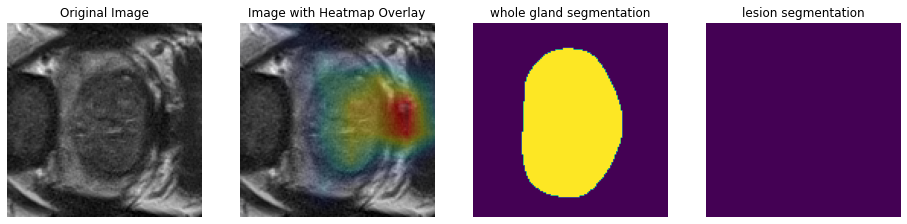


Evaluating input 1...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,  396.,  324., 1002.,
        1038., 1107.,  426.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.8569,  1.9634]], grad_fn=<AddmmBackward0>)
tensor([0.9785], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.12751252949237823


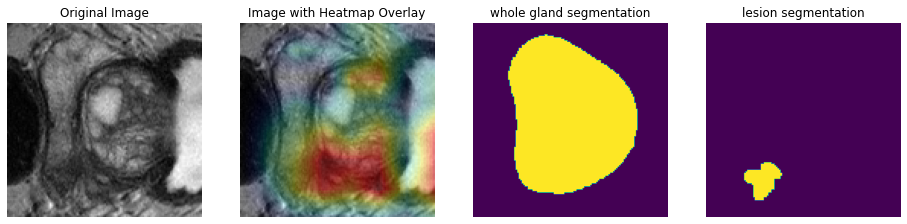


Evaluating input 2...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0., 1242., 1452., 3858., 5134., 5938., 5076., 6756.,
        7610., 5734.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.3658, -0.9992]], grad_fn=<AddmmBackward0>)
tensor([0.0859], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.7094578742980957


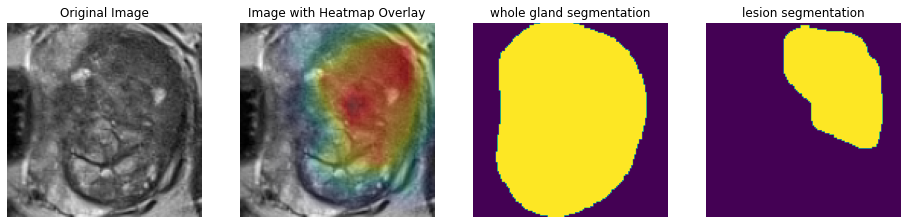


Evaluating input 3...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.3414,  0.5902]], grad_fn=<AddmmBackward0>)
tensor([0.7174], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


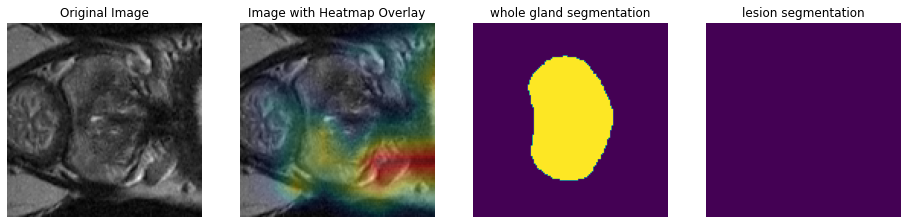


Evaluating input 4...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.1394, -0.8227]], grad_fn=<AddmmBackward0>)
tensor([0.1232], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


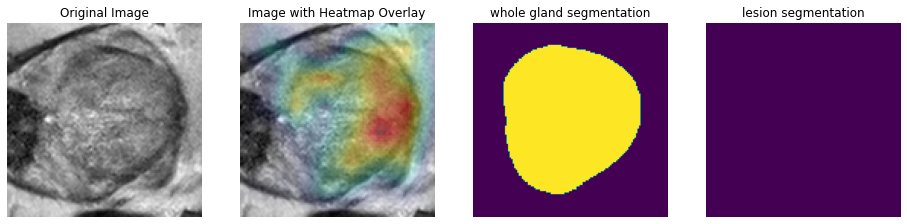


Evaluating input 5...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,  550., 3132., 2470., 1240.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.7834,  0.8700]], grad_fn=<AddmmBackward0>)
tensor([0.8393], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.3352242410182953


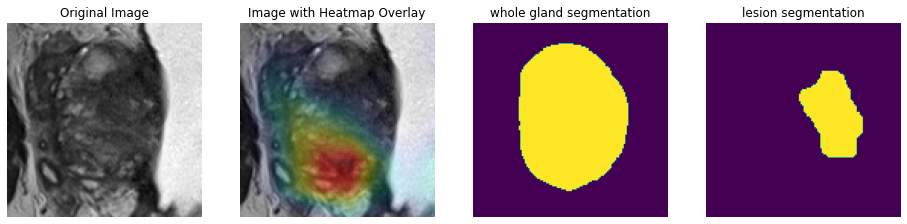


Evaluating input 6...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,  435.,  378.,  750., 1416.,  915.,  828.,  753.,  918.,  666.,
         495.,  153.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.6632, -0.4948]], grad_fn=<AddmmBackward0>)
tensor([0.2390], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.17782242596149445


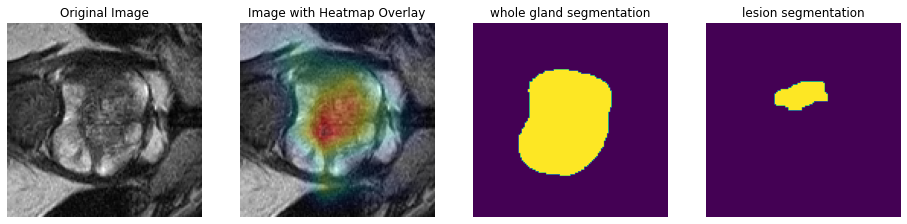


Evaluating input 7...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 2.0021, -1.7253]], grad_fn=<AddmmBackward0>)
tensor([0.0235], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


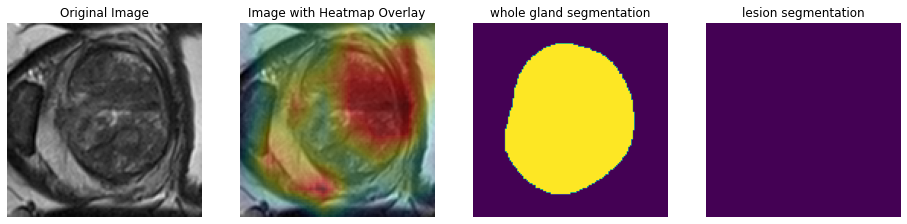


Evaluating input 8...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.9801, -0.7376]], grad_fn=<AddmmBackward0>)
tensor([0.1522], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


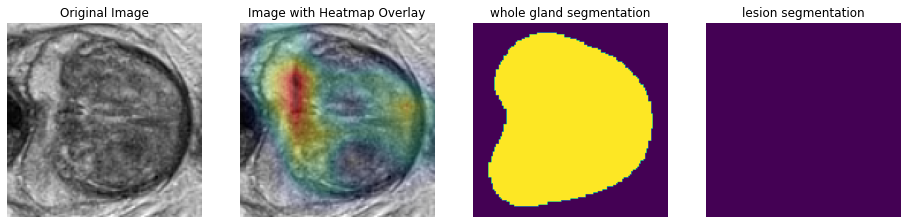


Evaluating input 9...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.3030,  0.5859]], grad_fn=<AddmmBackward0>)
tensor([0.7087], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


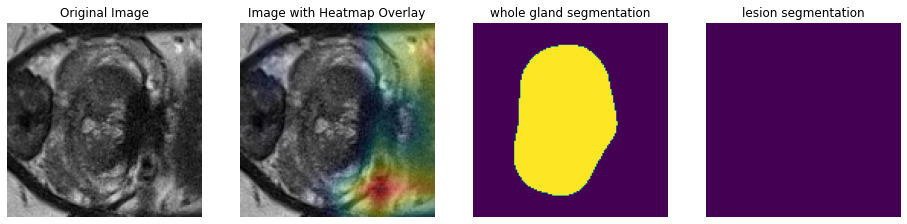


Evaluating input 10...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,  490., 2545., 1120.,  970.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.4556,  0.8693]], grad_fn=<AddmmBackward0>)
tensor([0.7900], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.2974868416786194


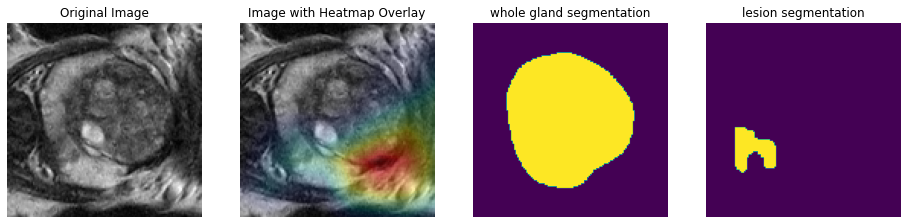


Evaluating input 11...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.7104, -0.3926]], grad_fn=<AddmmBackward0>)
tensor([0.2492], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


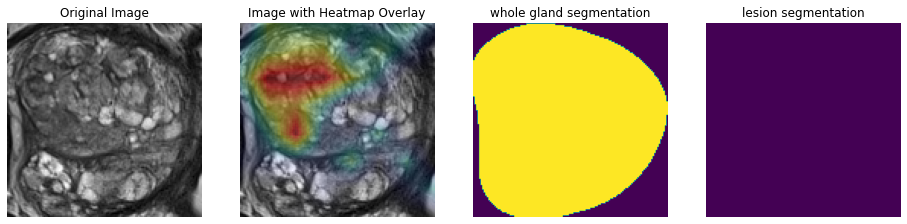


Evaluating input 12...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0., 512., 672., 672., 142.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.4838, -0.0762]], grad_fn=<AddmmBackward0>)
tensor([0.3636], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.004655621014535427


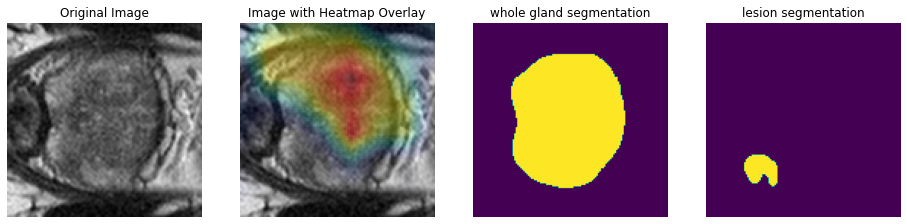


Evaluating input 13...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0., 626., 856., 856., 478., 400.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.7728,  1.1912]], grad_fn=<AddmmBackward0>)
tensor([0.8770], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.10175938904285431


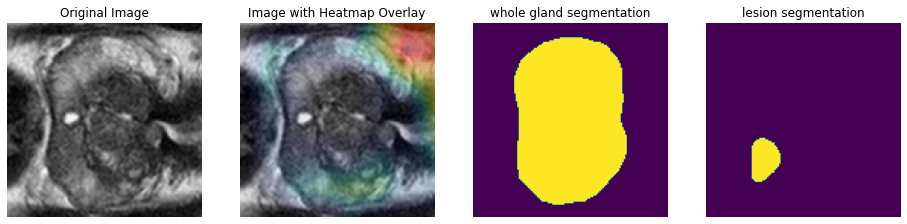


Evaluating input 14...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,  78., 294., 132.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.3282,  1.5684]], grad_fn=<AddmmBackward0>)
tensor([0.9477], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.036157913506031036


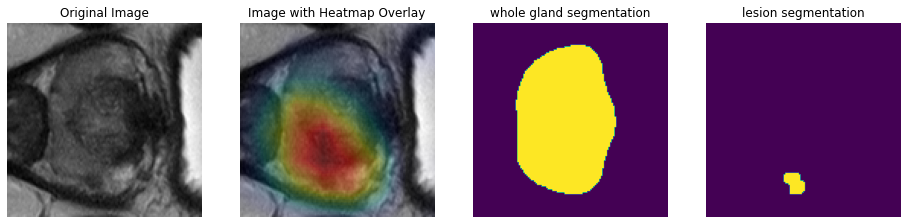


Evaluating input 15...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.2458,  0.7352]], grad_fn=<AddmmBackward0>)
tensor([0.7273], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


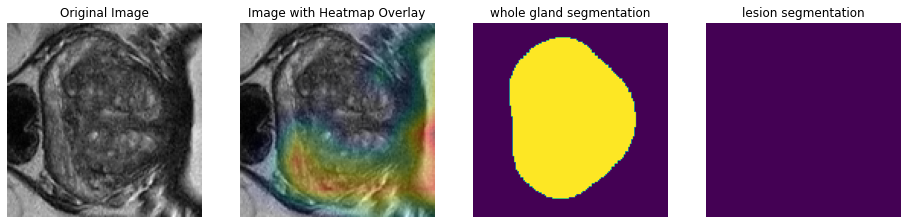


Evaluating input 16...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.1099, -0.7108]], grad_fn=<AddmmBackward0>)
tensor([0.1393], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


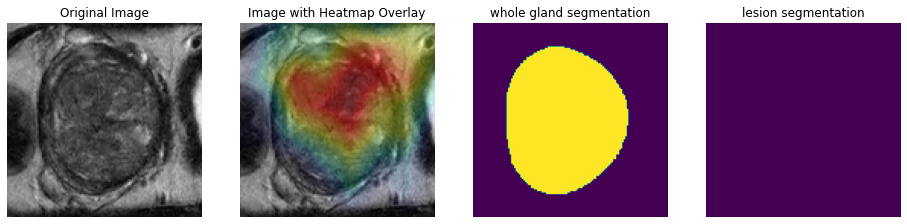


Evaluating input 17...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.3809,  1.7048]], grad_fn=<AddmmBackward0>)
tensor([0.9563], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


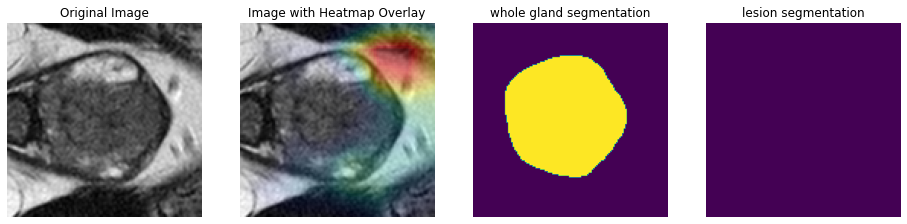


Evaluating input 18...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0., 1344., 1752., 2988., 1551.,    0.,    0.,    0.,
           0.,  416.,  874.,  758.,  642.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.4086,  1.6808]], grad_fn=<AddmmBackward0>)
tensor([0.9565], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.3539026379585266


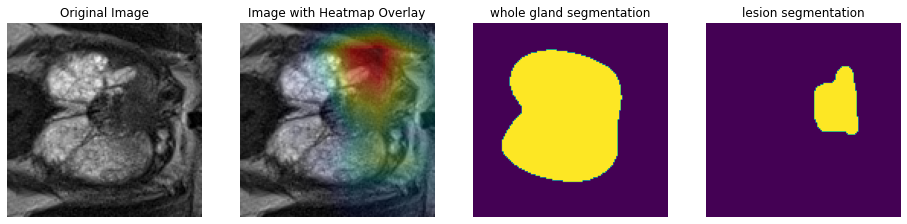


Evaluating input 19...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.4600, -0.9010]], grad_fn=<AddmmBackward0>)
tensor([0.0862], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


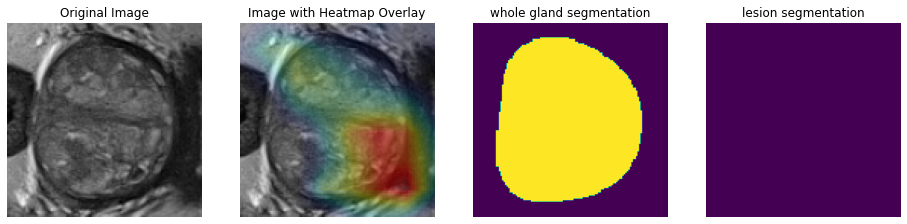


Evaluating input 20...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0., 1596., 2583., 2259., 3003.,
        2766., 2667., 1986.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.2102,  0.5343]], grad_fn=<AddmmBackward0>)
tensor([0.6780], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.07190032303333282


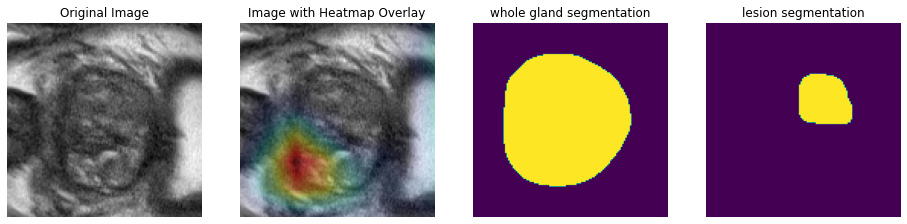


Evaluating input 21...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
        468.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-2.5489,  2.6192]], grad_fn=<AddmmBackward0>)
tensor([0.9943], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.055907297879457474


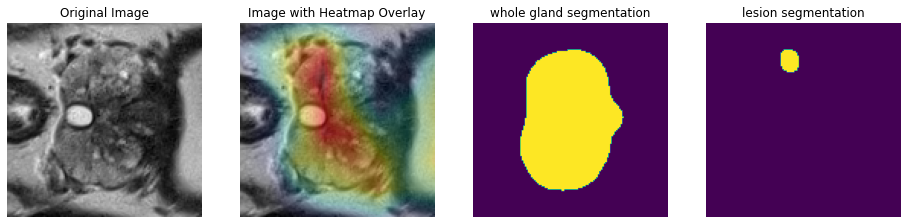


Evaluating input 22...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 626., 904., 834.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.8484,  1.0074]], grad_fn=<AddmmBackward0>)
tensor([0.8648], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.09227579087018967


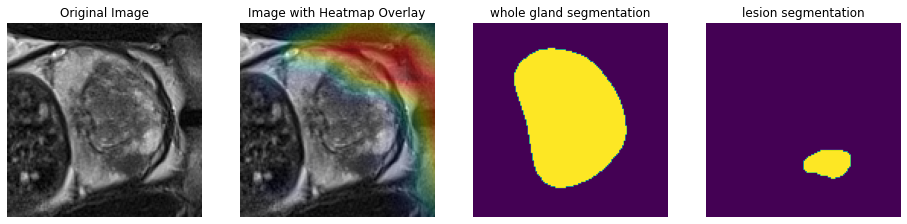


Evaluating input 23...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.6682,  0.8556]], grad_fn=<AddmmBackward0>)
tensor([0.8211], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


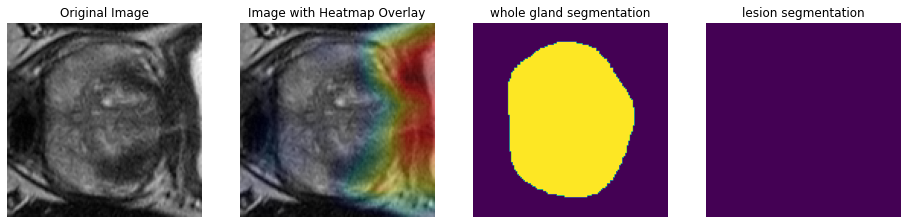


Evaluating input 24...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.5914, -0.3443]], grad_fn=<AddmmBackward0>)
tensor([0.2818], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


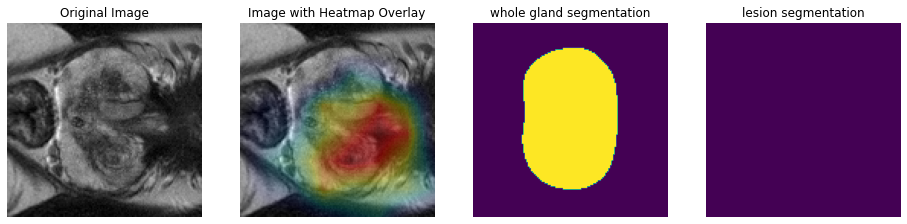


Evaluating input 25...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.2562, 0.1666]], grad_fn=<AddmmBackward0>)
tensor([0.4776], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


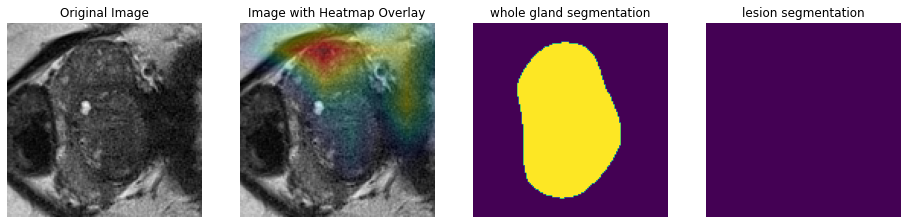


Evaluating input 26...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.3123, -0.8305]], grad_fn=<AddmmBackward0>)
tensor([0.1050], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


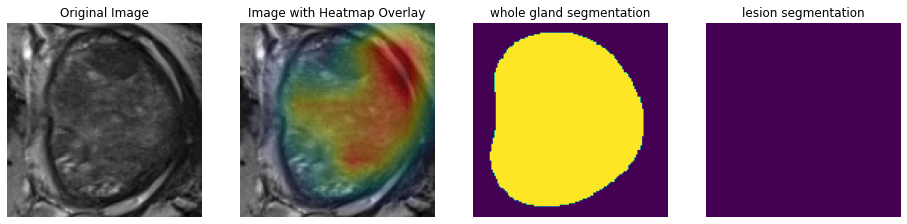


Evaluating input 27...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.9695, -1.4917]], grad_fn=<AddmmBackward0>)
tensor([0.0304], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


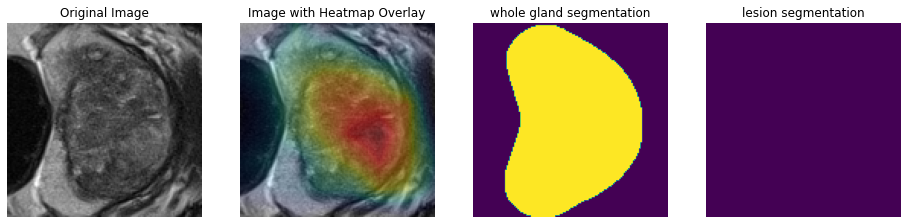


Evaluating input 28...
torch.Size([1, 1, 128, 128, 16])
tensor([ 537., 1011., 1308., 2175., 1959.,  807.,  408.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.3961,  0.7503]], grad_fn=<AddmmBackward0>)
tensor([0.7589], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.27064019441604614


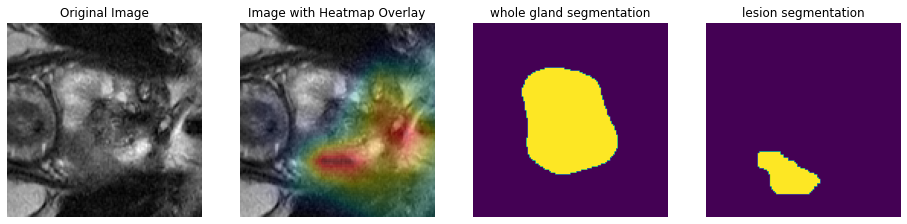


Evaluating input 29...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.1291, -0.7149]], grad_fn=<AddmmBackward0>)
tensor([0.1366], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


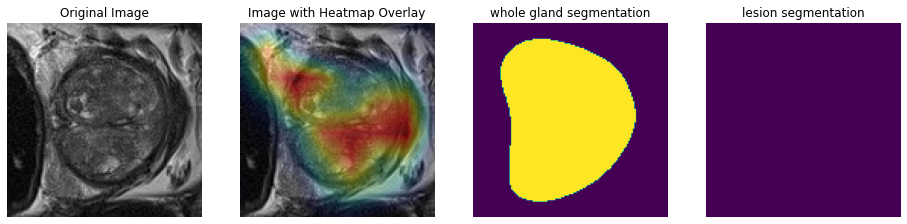


Evaluating input 30...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0., 1238., 1568.,
         990.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.7747,  0.9522]], grad_fn=<AddmmBackward0>)
tensor([0.8490], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.19792981445789337


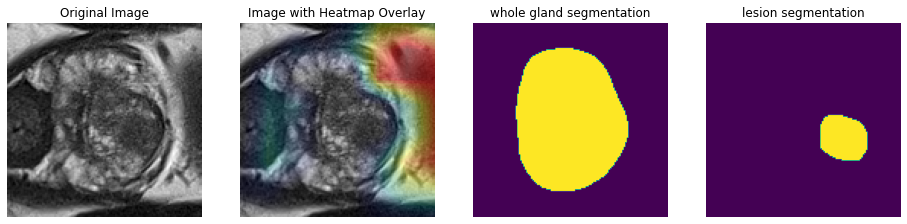


Evaluating input 31...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.5111,  1.0207]], grad_fn=<AddmmBackward0>)
tensor([0.8223], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


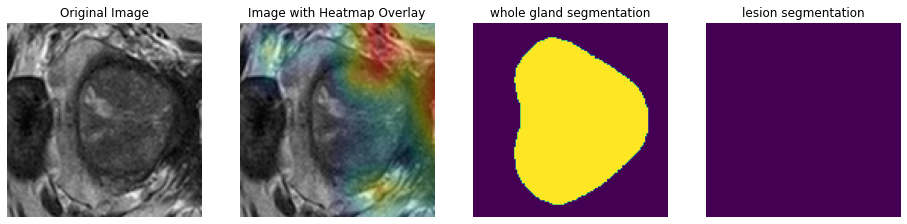


Evaluating input 32...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.4007,  0.7022]], grad_fn=<AddmmBackward0>)
tensor([0.7508], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


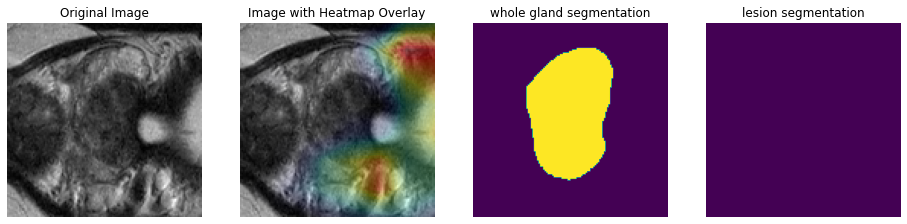


Evaluating input 33...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.7301, 0.0691]], grad_fn=<AddmmBackward0>)
tensor([0.3405], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


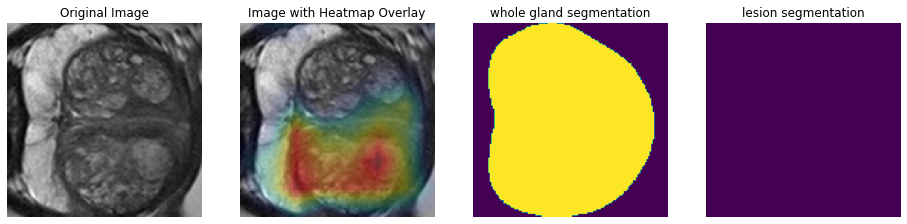


Evaluating input 34...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.0903,  0.7363]], grad_fn=<AddmmBackward0>)
tensor([0.6956], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


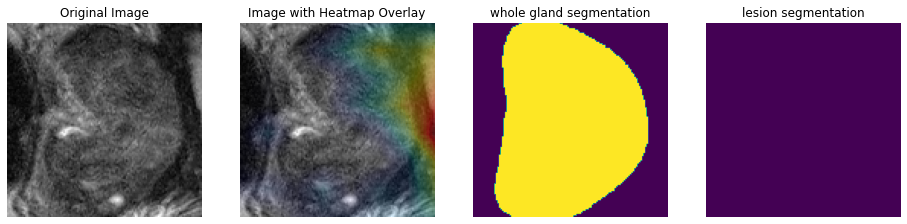


Evaluating input 35...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,  490., 1548., 2128., 1916.,
        1428., 1208., 1042.,  792.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.0497, 0.2283]], grad_fn=<AddmmBackward0>)
tensor([0.5445], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.29930591583251953


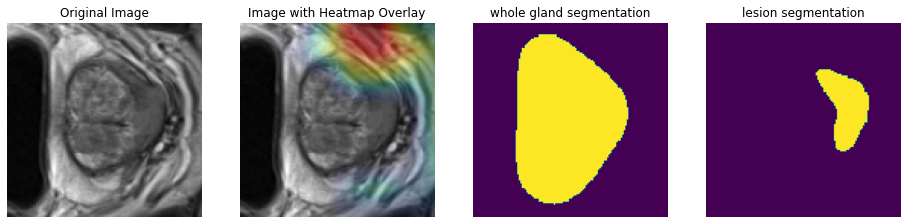


Evaluating input 36...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.0514, 0.5245]], grad_fn=<AddmmBackward0>)
tensor([0.6161], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


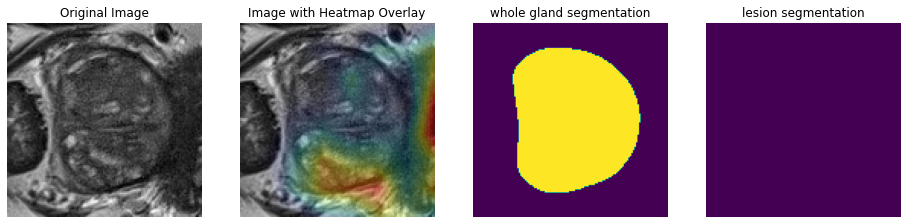


Evaluating input 37...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,  340.,  222.,    0.,    0.,    0., 1528., 1774.,
        2782., 2848., 1540.,  850.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.5186,  0.7465]], grad_fn=<AddmmBackward0>)
tensor([0.7799], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.38528138399124146


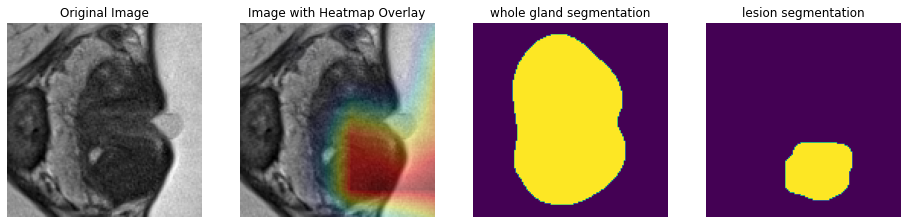


Evaluating input 38...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.3187, 0.0376]], grad_fn=<AddmmBackward0>)
tensor([0.4302], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


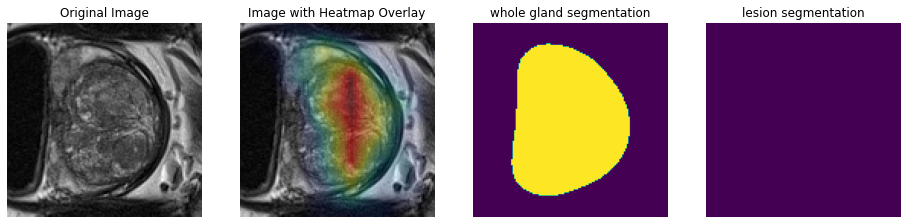


Evaluating input 39...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,  298.,  584.,  910., 1456., 2828.,
        2846., 2846., 1858., 1424.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.1752,  0.4694]], grad_fn=<AddmmBackward0>)
tensor([0.6558], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.37071239948272705


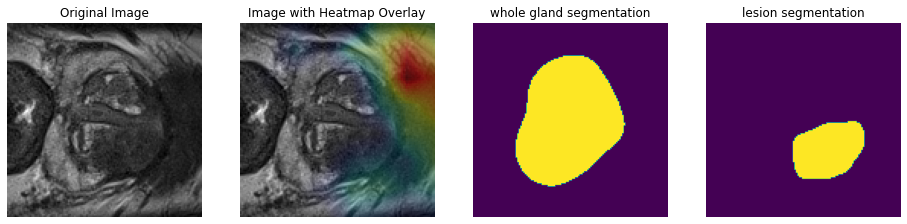


Evaluating input 40...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 225., 336.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.1003,  0.3660]], grad_fn=<AddmmBackward0>)
tensor([0.6145], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.007478005718439817


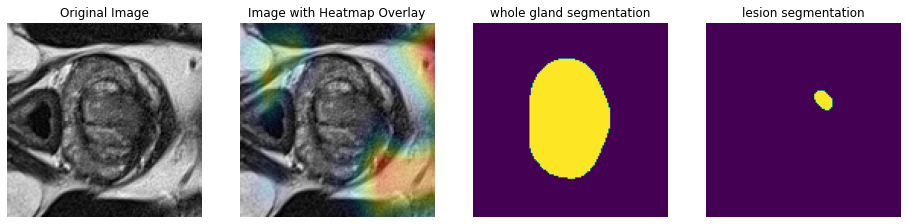


Evaluating input 41...
torch.Size([1, 1, 128, 128, 16])
tensor([268., 538., 380., 302., 238., 382., 412., 204.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.3226,  0.3689]], grad_fn=<AddmmBackward0>)
tensor([0.6663], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.06816165894269943


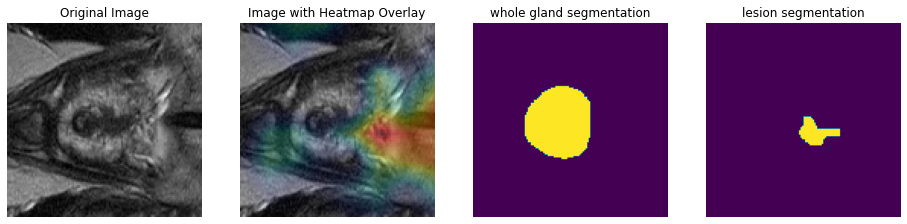


Evaluating input 42...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.2406,  0.4082]], grad_fn=<AddmmBackward0>)
tensor([0.6567], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


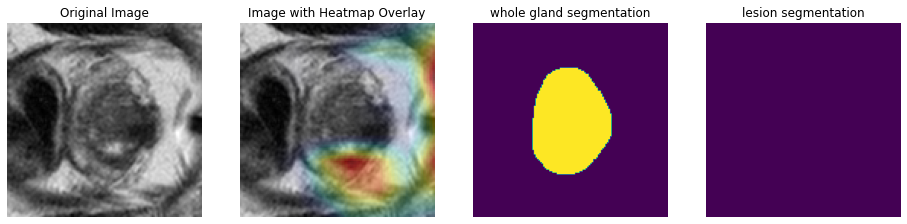


Evaluating input 43...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0., 256., 174.,  68.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.8800,  1.1206]], grad_fn=<AddmmBackward0>)
tensor([0.8809], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.03162836655974388


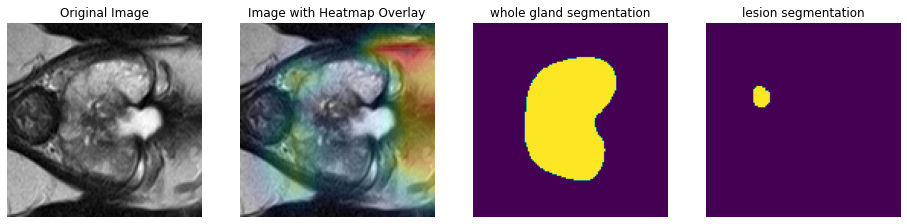


Evaluating input 44...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.4783,  0.7648]], grad_fn=<AddmmBackward0>)
tensor([0.7761], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


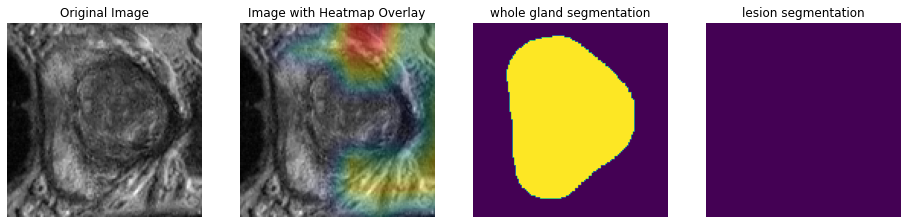


Evaluating input 45...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0., 302., 420., 574., 688.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.9181,  1.2510]], grad_fn=<AddmmBackward0>)
tensor([0.8974], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.09280615299940109


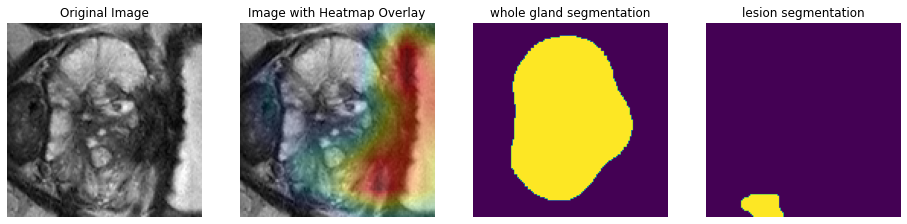


Evaluating input 46...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.8310, -1.3610]], grad_fn=<AddmmBackward0>)
tensor([0.0395], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


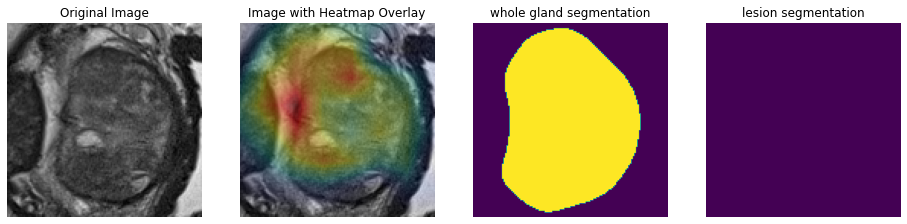


Evaluating input 47...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.3785,  1.5649]], grad_fn=<AddmmBackward0>)
tensor([0.9499], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


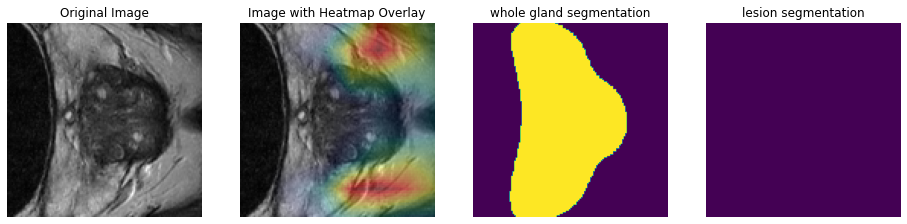


Evaluating input 48...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.5156, -0.9949]], grad_fn=<AddmmBackward0>)
tensor([0.0751], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


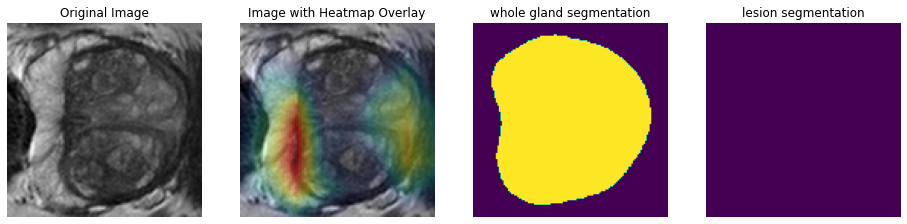


Evaluating input 49...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,  108.,  708., 1074.,  928.,  928.,  908.,  574.,
         242.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.1529,  0.2924]], grad_fn=<AddmmBackward0>)
tensor([0.6095], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.05872242897748947


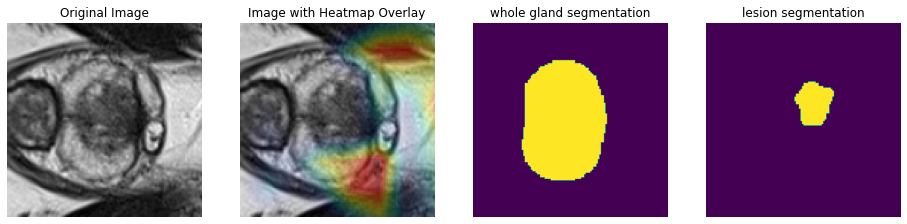


Evaluating input 50...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,  872., 1278., 1500., 2306.,  770.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.1768, -0.0056]], grad_fn=<AddmmBackward0>)
tensor([0.4545], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.32118821144104004


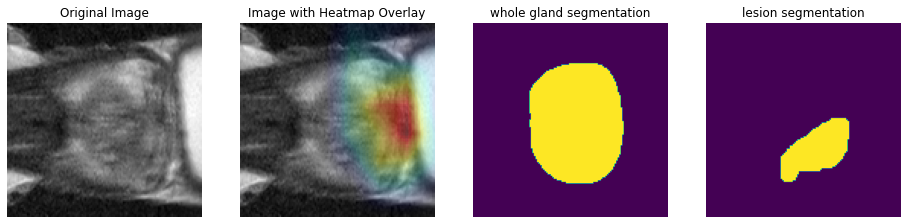


Evaluating input 51...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.0651, -0.7914]], grad_fn=<AddmmBackward0>)
tensor([0.1351], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


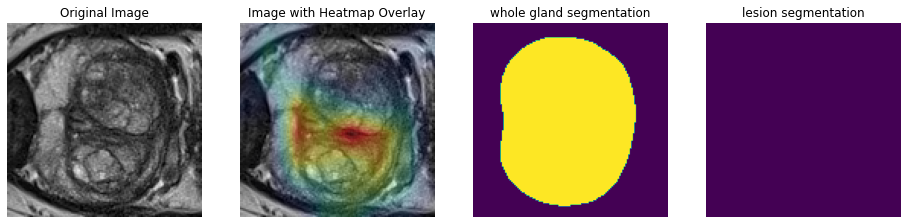


Evaluating input 52...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.6853,  1.0523]], grad_fn=<AddmmBackward0>)
tensor([0.8504], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


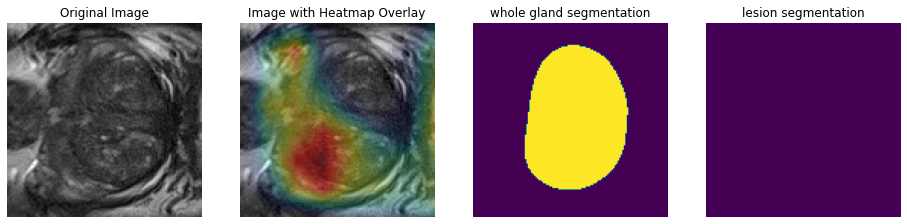


Evaluating input 53...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 252., 428., 190.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.1237,  0.3062]], grad_fn=<AddmmBackward0>)
tensor([0.6058], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.042920101433992386


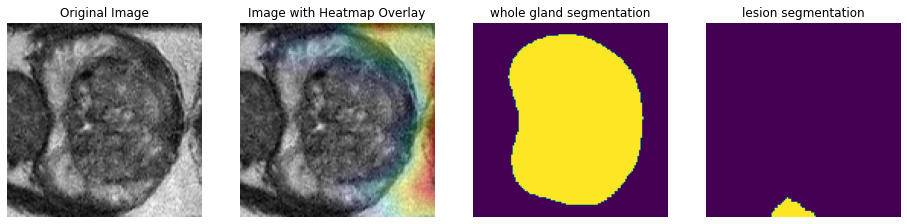


Evaluating input 54...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.0016, -0.7192]], grad_fn=<AddmmBackward0>)
tensor([0.1518], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


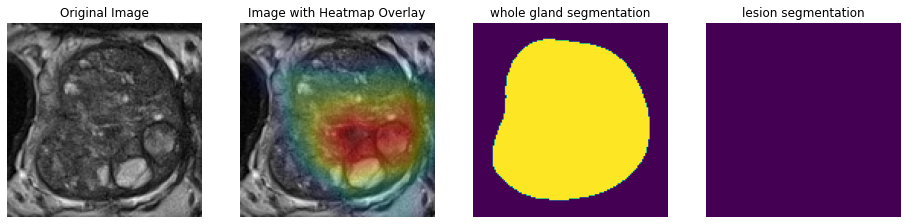


Evaluating input 55...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.0770, 0.2578]], grad_fn=<AddmmBackward0>)
tensor([0.5451], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


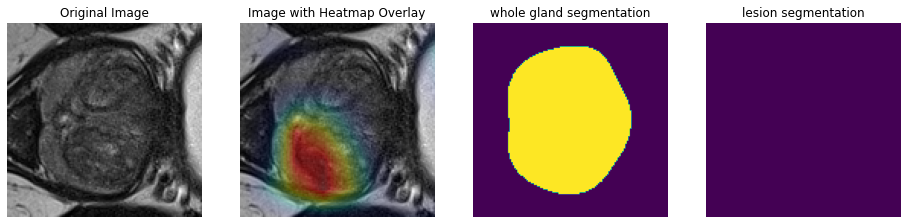


Evaluating input 56...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.7186, -0.2451]], grad_fn=<AddmmBackward0>)
tensor([0.2761], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


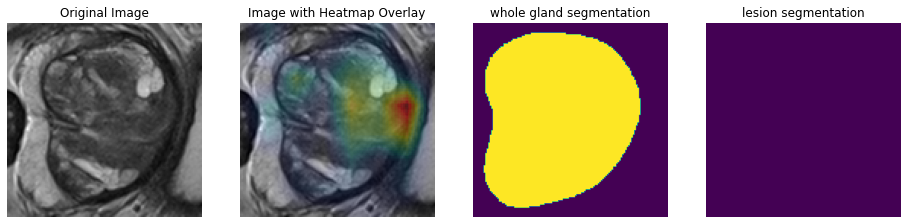


Evaluating input 57...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.2837, -0.4993]], grad_fn=<AddmmBackward0>)
tensor([0.1439], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


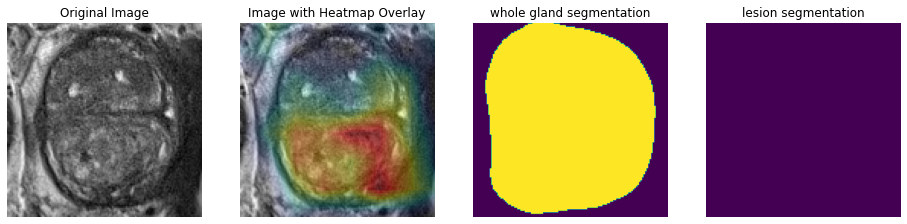


Evaluating input 58...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.5208, -0.0607]], grad_fn=<AddmmBackward0>)
tensor([0.3586], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


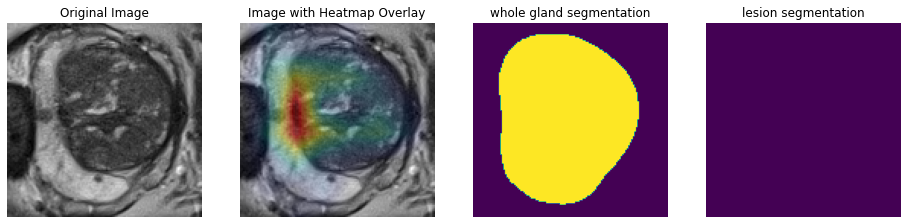


Evaluating input 59...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0., 342., 474., 474., 426., 226.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.3565,  0.9727]], grad_fn=<AddmmBackward0>)
tensor([0.7907], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.05861983820796013


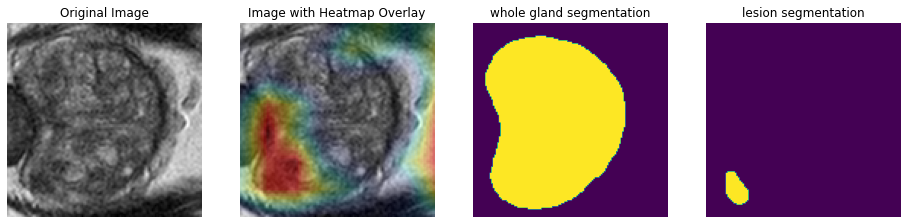


Evaluating input 60...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.2993, -1.1175]], grad_fn=<AddmmBackward0>)
tensor([0.0819], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


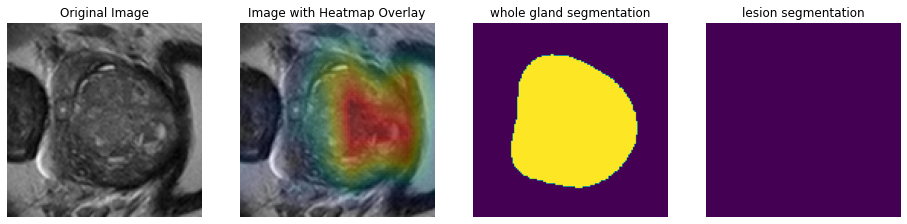


Evaluating input 61...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,  862., 1078., 1284.,  736.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.3822,  0.7233]], grad_fn=<AddmmBackward0>)
tensor([0.7513], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.15300285816192627


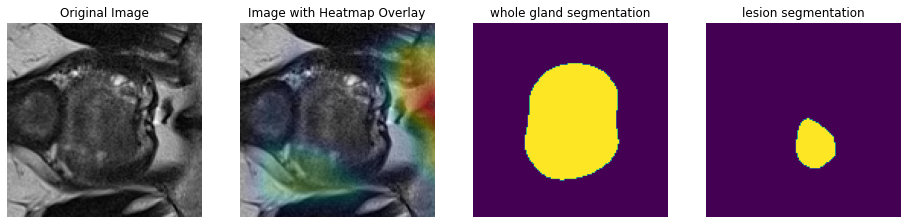


Evaluating input 62...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 2.2395, -1.7450]], grad_fn=<AddmmBackward0>)
tensor([0.0183], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


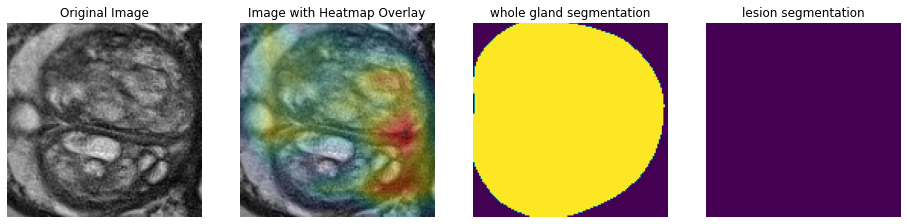


Evaluating input 63...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,  434.,  678., 1180.,
         590.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.1037,  1.2853]], grad_fn=<AddmmBackward0>)
tensor([0.9160], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.166878804564476


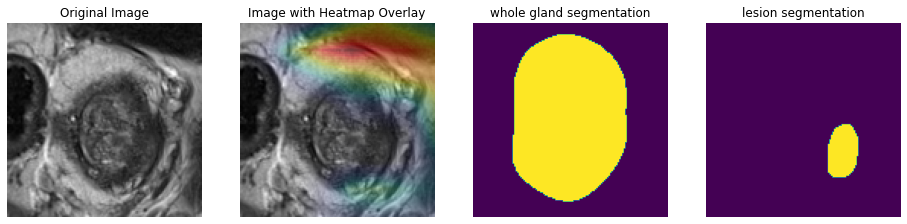


Evaluating input 64...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0., 1815., 4110., 4915., 7170., 7345.,
        7610., 6975., 3455., 2925.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.0467,  1.2400]], grad_fn=<AddmmBackward0>)
tensor([0.9078], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.6233607530593872


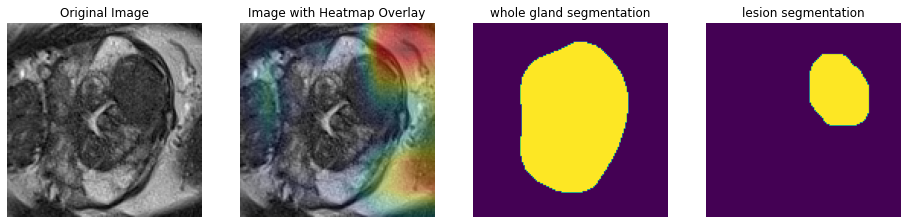


Evaluating input 65...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 285., 372., 339.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.2080,  1.3448]], grad_fn=<AddmmBackward0>)
tensor([0.9278], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.0532112717628479


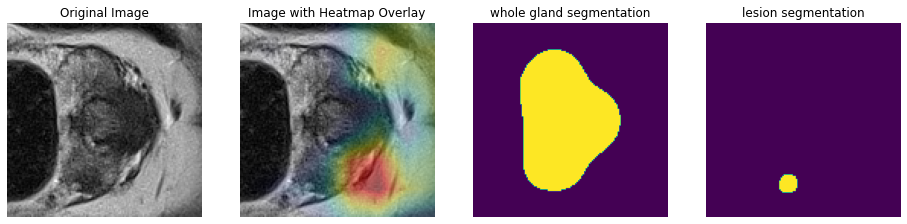


Evaluating input 66...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.4333, -0.2130]], grad_fn=<AddmmBackward0>)
tensor([0.3438], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


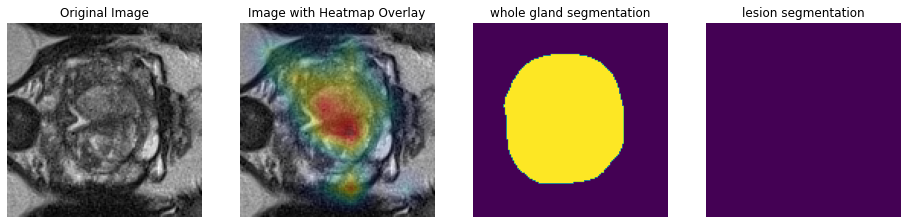


Evaluating input 67...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.9364,  1.0580]], grad_fn=<AddmmBackward0>)
tensor([0.8802], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


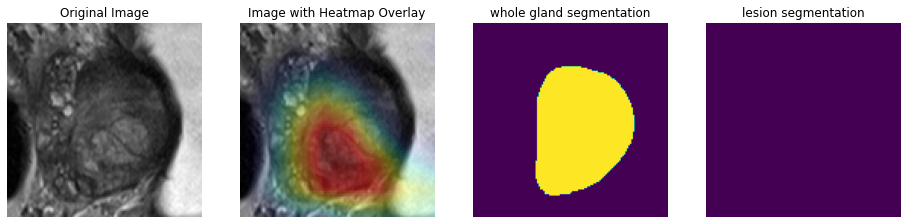


Evaluating input 68...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0., 604., 614., 512.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.2271,  0.4210]], grad_fn=<AddmmBackward0>)
tensor([0.6566], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.07912371307611465


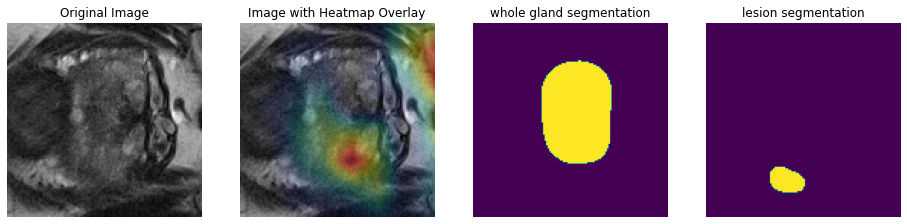


Evaluating input 69...
torch.Size([1, 1, 128, 128, 16])
tensor([   0., 1258., 2222., 2592., 2134., 2542., 2400., 2376., 2482., 3456.,
        2708., 1736., 1962.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.3006,  1.5124]], grad_fn=<AddmmBackward0>)
tensor([0.9434], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.37753987312316895


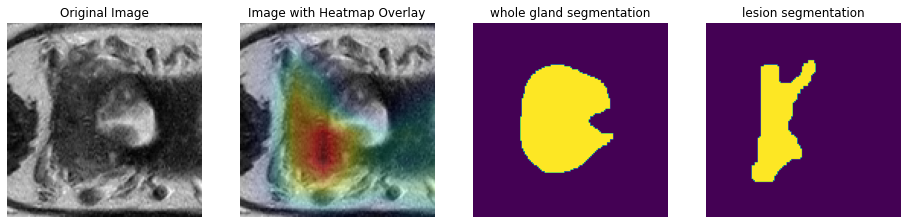


Evaluating input 70...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.1201, -0.8346]], grad_fn=<AddmmBackward0>)
tensor([0.1240], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


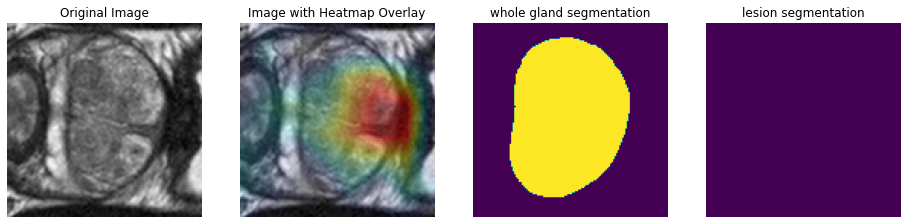


Evaluating input 71...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 2.0165, -1.5706]], grad_fn=<AddmmBackward0>)
tensor([0.0269], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


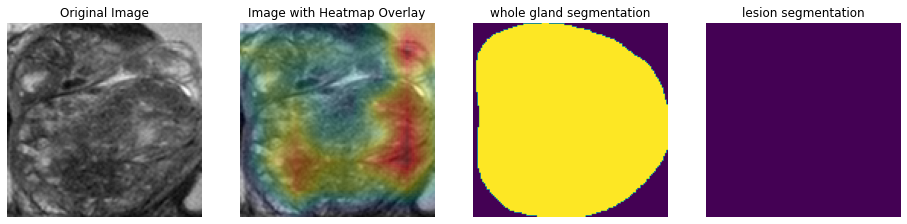


Evaluating input 72...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.1660,  1.3023]], grad_fn=<AddmmBackward0>)
tensor([0.9219], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


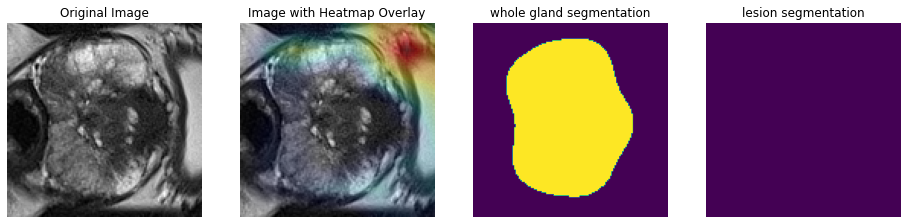


Evaluating input 73...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0., 340., 268., 178.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.2742, 0.1828]], grad_fn=<AddmmBackward0>)
tensor([0.4772], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.04476776719093323


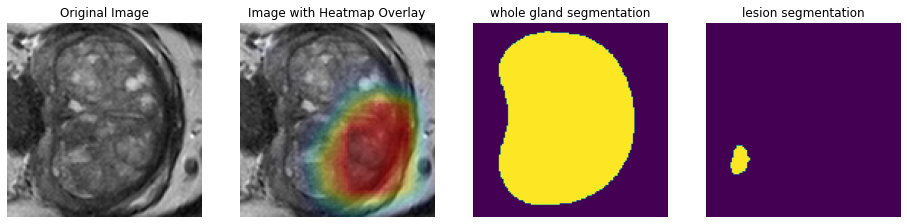


Evaluating input 74...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,  640.,
         970., 1024.,  750.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.4972,  0.6189]], grad_fn=<AddmmBackward0>)
tensor([0.7533], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.13626080751419067


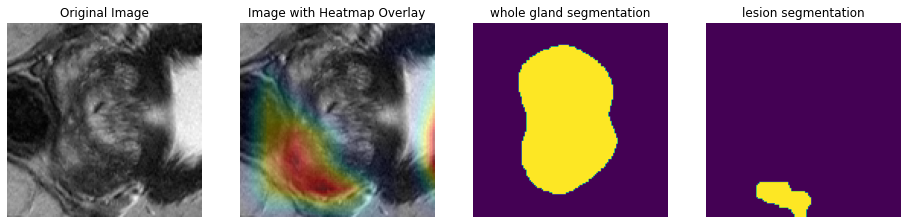


Evaluating input 75...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,  252.,  770., 1400., 1364., 1876., 1374.,
        1030., 1240.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-1.9901,  1.9919]], grad_fn=<AddmmBackward0>)
tensor([0.9817], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.20588235557079315


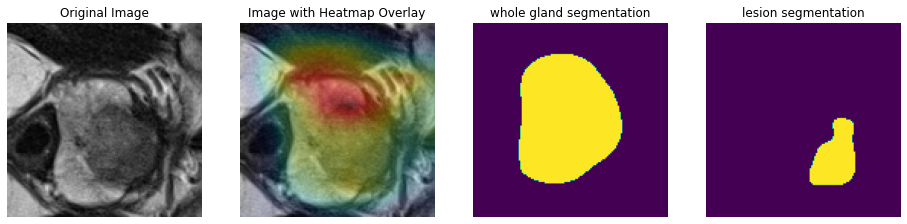


Evaluating input 76...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.1364, -0.1187]], grad_fn=<AddmmBackward0>)
tensor([0.4366], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


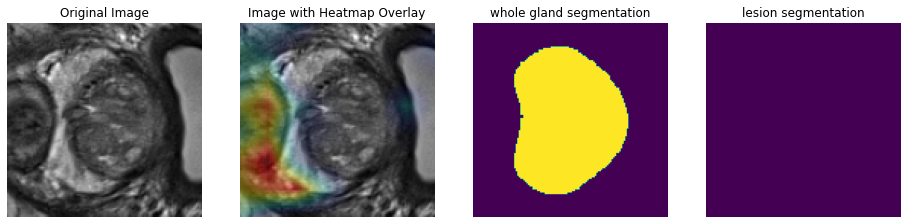


Evaluating input 77...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,  690.,  912.,  912.,  918., 1278.,
         492.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.0337, 0.0848]], grad_fn=<AddmmBackward0>)
tensor([0.5128], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.18438898026943207


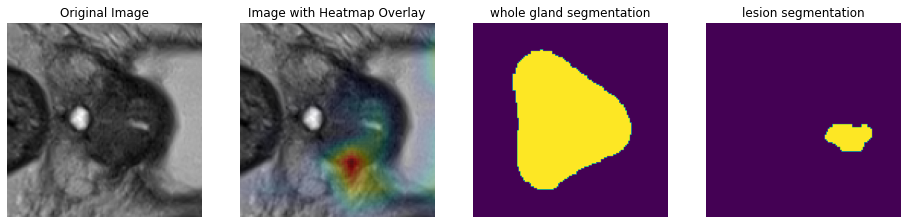


Evaluating input 78...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0., 1460., 1664.,
        1170.,  914.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.0490, 0.1785]], grad_fn=<AddmmBackward0>)
tensor([0.5323], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.16858941316604614


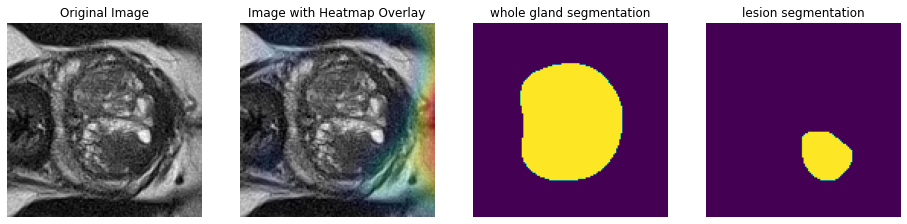


Evaluating input 79...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,  600., 1134., 1467.,  735., 1044.,
        1194.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[0.0506, 0.0074]], grad_fn=<AddmmBackward0>)
tensor([0.4892], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.23778264224529266


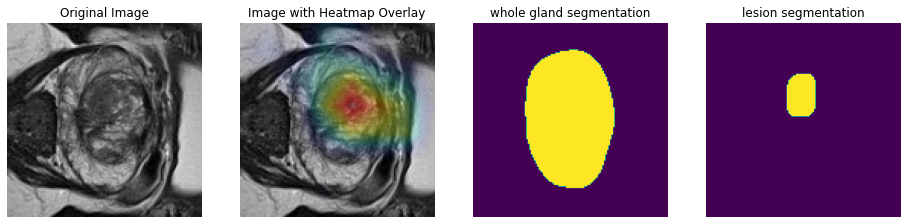


Evaluating input 80...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,  270.,  592.,  810., 1198., 1052., 1210.,
         292.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.1285,  0.3794]], grad_fn=<AddmmBackward0>)
tensor([0.6243], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.18358367681503296


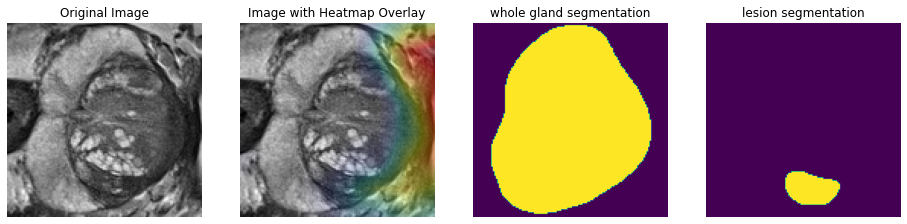


Evaluating input 81...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 1.4816, -1.2116]], grad_fn=<AddmmBackward0>)
tensor([0.0634], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


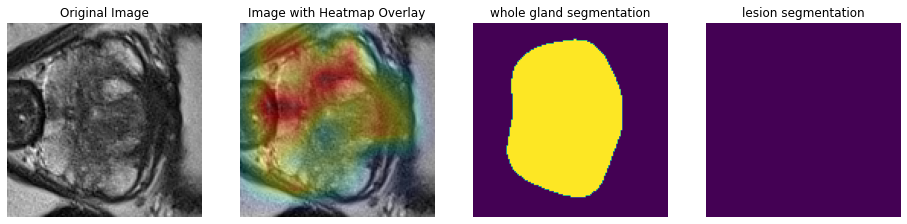


Evaluating input 82...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,  272.,  268.,  986., 1216.,  546.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.7701,  0.8312]], grad_fn=<AddmmBackward0>)
tensor([0.8322], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.17974871397018433


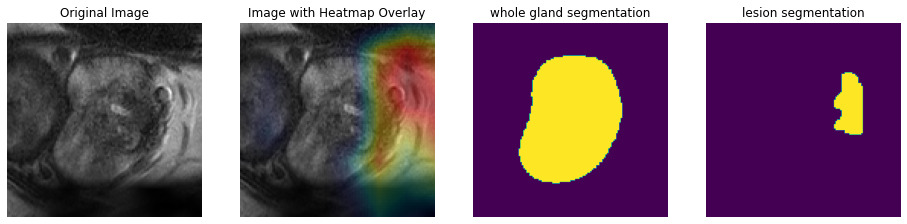


Evaluating input 83...
torch.Size([1, 1, 128, 128, 16])
tensor([  0.,   0.,   0.,   0.,   0., 748., 470., 412.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.5591,  1.0735]], grad_fn=<AddmmBackward0>)
tensor([0.8365], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.04964539036154747


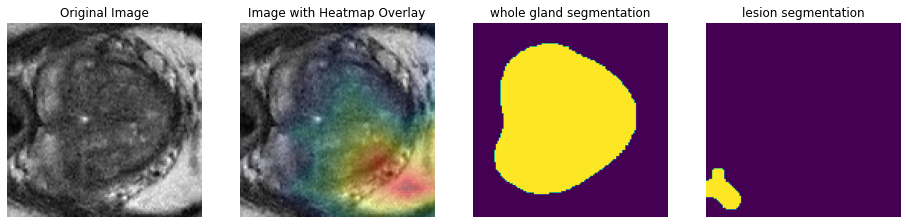


Evaluating input 84...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,  948., 1412., 1066.,  752.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.6100,  0.8418]], grad_fn=<AddmmBackward0>)
tensor([0.8103], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.1370348483324051


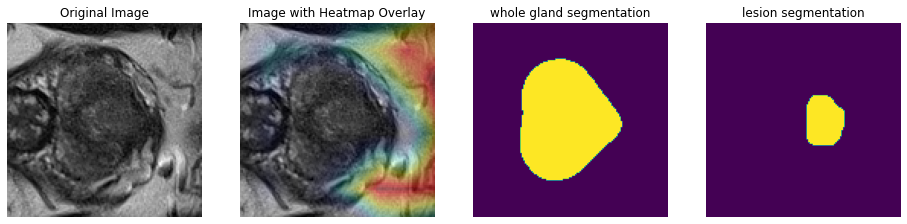


Evaluating input 85...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,  867., 2487., 2397., 1947., 1371.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.])
torch.Size([1, 3, 128, 128])
pred tensor([[-0.1826,  0.3895]], grad_fn=<AddmmBackward0>)
tensor([0.6393], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.29048648476600647


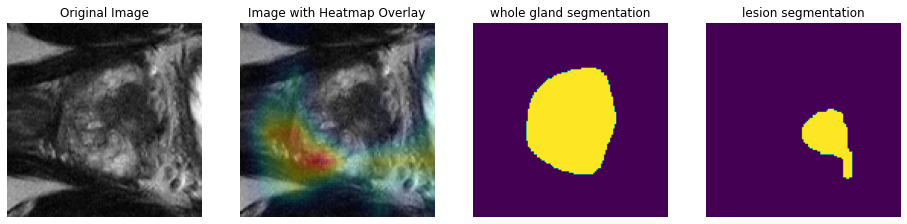


Evaluating input 86...
torch.Size([1, 1, 128, 128, 16])
tensor([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        1404., 1994., 2486., 2570., 2874., 3178.])
torch.Size([1, 3, 128, 128])
pred tensor([[-2.0928,  1.9971]], grad_fn=<AddmmBackward0>)
tensor([0.9835], grad_fn=<SelectBackward0>)
idx tensor([1])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])
torch.Size([1, 1, 128, 128])
torch.Size([1, 1, 128, 128, 16])
Dice Score: 0.3264509439468384


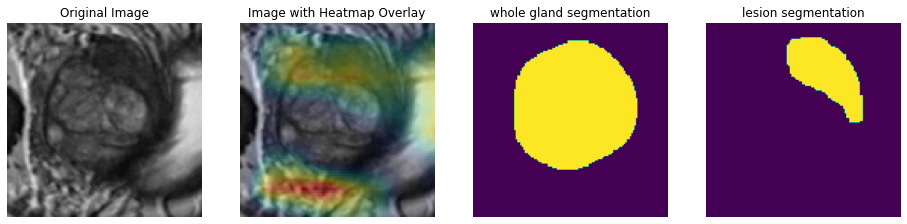


Evaluating input 87...
torch.Size([1, 1, 128, 128, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
torch.Size([1, 3, 128, 128])
pred tensor([[ 0.8395, -0.3371]], grad_fn=<AddmmBackward0>)
tensor([0.2357], grad_fn=<SelectBackward0>)
idx tensor([0])
torch.Size([1, 256, 8, 8])
torch.Size([8, 8])


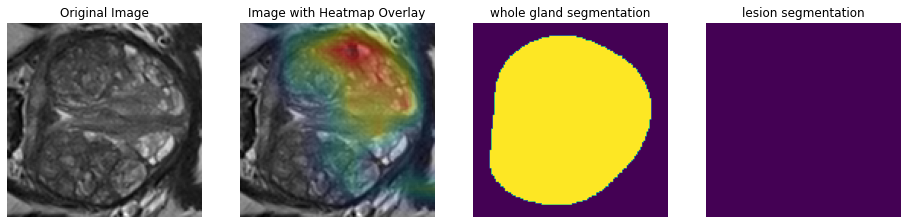

In [131]:
import torch.nn.functional as F
from torchmetrics import Accuracy, ConfusionMatrix
from monai.metrics import DiceMetric

# evaluation_results = list()
accuracy_metric = Accuracy(task='binary')
confusion_metric = ConfusionMatrix(task='binary', num_classes=2)
dice_metric = DiceMetric(include_background=False, reduction="mean")

module.model.eval()

probabilities = []
predictions = []
labels = []
dice = []

for i, test_data in enumerate(test_loader):
    print('Evaluating input {}...'.format(i))
    # print(test_data.keys())
    images = test_data["IMAGE"]
    adcs = test_data["ADC_REGISTERED_BIS"]
    wg_segm = test_data["SEGM_WG_AI"]
    lesion = test_data["SEGM_LESION_HUMAN"]
    lesion_sum = lesion.sum(dim=(0,1,2,3))
    print(lesion.shape)
    print(lesion_sum)
    
    
    if any(lesion_sum):
        slice_num = torch.argmax(lesion_sum)      # slice w/ most lesions
    else:
        slice_num = images.shape[-1] // 2       # middle slice
#         print(slice_num)
    images_sliced = images[..., slice_num]
    adc_sliced = adcs[..., slice_num]
    wg_segm_sliced = wg_segm[..., slice_num]
        
        
    inputs = torch.cat((images_sliced, adc_sliced, wg_segm_sliced), dim=1)   # concat T2W and ADC
    print(inputs.shape)
    ys = test_data["ISUP"]
#     one_hot_ys = torch.nn.functional.one_hot(ys.long(), num_classes=5)
    # print(inputs.shape)
    pred = module.model(inputs)
    print("pred", pred)
    pred_prob = torch.nn.functional.softmax(pred)[:, 1]
    print(pred_prob)
#     print("pred argmax", pred.argmax(dim=1))

#     print("one_hot_ys", one_hot_ys)

    # print("pred", pred[:, 2])

    class_idx = pred.argmax(dim=1)
    
    print("idx", class_idx)
    
    probabilities.extend(pred_prob.detach().cpu().numpy())
    predictions.extend(class_idx.cpu().numpy())
    labels.extend(ys.cpu().numpy())
        
    # get gradients
    pred[:, class_idx].backward()
    
    gradients = module.model.get_activations_gradients()
    print(gradients.shape)
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

    activations = module.model.get_activations(inputs).detach()
    # print("activation shape", activations.shape)
    for i in range(256):
        activations[:, i, :, :] *= pooled_gradients[i]
    
#     print(activations.shape)
    
    heatmap = torch.mean(activations, dim=1).squeeze()

#     if len(heatmap.shape) == 2:     # something 8,8 due to squeeze, because input (128, 128, 16) --> (8, 8, 1) to 4th layer
#         heatmap = heatmap.unsqueeze(-1)
    print(heatmap.shape)

    heatmap = F.relu(heatmap)
    heatmap /= torch.max(heatmap)

#     fig, ax = plt.subplots(1, 1, figsize=(10, 6))

#     ax.imshow(heatmap)

    images_squeeze = images.squeeze()
    wg_segm_squeeze = wg_segm.squeeze()
    lesion_segm_squeeze = lesion.squeeze()

    
    resized_heatmap = resize_heatmap(heatmap, images_squeeze.shape)
    
    resized_heatmap_binary = torch.tensor(resized_heatmap.copy())
    resized_heatmap_binary[resized_heatmap_binary != 0] = 1
#     print("image_slice shape", images_squeeze.shape)
#     print("heatmap shape", heatmap.shape)
#     print("resized heatmap shape", resized_heatmap)
#     print("binary heatmap", resized_heatmap_binary)
#     print("wg_segm_squeeze shape", wg_segm_squeeze.shape)
#     print("lesion_segm_squeeze shape", lesion_segm_squeeze.shape)


    if any(lesion_sum):
        slice_num = np.argmax(lesion_sum)      # slice w/ most lesions
        
        resized_heatmap_binary_fordice = resized_heatmap_binary[None, None, :]
        lesion_segm_fordice = lesion_segm_squeeze[None, None, :]
        print(resized_heatmap_binary_fordice.shape)
        print(lesion_segm_fordice.shape)
        dice_score = dice_metric(resized_heatmap_binary_fordice, lesion_segm_fordice[..., slice_num])
        print("Dice Score:", dice_score.item())
        dice.append(dice_score.item())
        
    else:
        slice_num = images.shape[-1] // 2       # middle slice
        
        
    display_images_with_heatmap(images_squeeze[:,:,slice_num], resized_heatmap, 
                                wg_segm_squeeze[:,:,slice_num], lesion_segm_squeeze[:,:,slice_num])
    print()

In [136]:
np.mean(dice)

0.18993480595608436

In [116]:
accuracy = (np.array(predictions) == np.array(labels)).mean()
print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 75.00%


In [117]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, roc_auc_score

cm = confusion_matrix(labels, predictions)
precision = precision_score(labels, predictions)
recall = recall_score(labels, predictions)
print("Confusion Matrix:\n", cm)
print(precision, recall)

Confusion Matrix:
 [[29 16]
 [ 6 37]]
0.6981132075471698 0.8604651162790697


In [118]:
from sklearn.metrics import roc_auc_score

auc = roc_auc_score(labels, probabilities)
print(f'AUC: {auc:.2f}')

AUC: 0.79
